In [2]:
import polars as pl
import numpy as np
import matplotlib.pyplot as plt
import json
import pathlib

In [3]:
import lazynwb
lazynwb.config.anon = True # so we don't need credentials to access the data on S3

In [5]:
import pandas as pd
structure_tree = pd.read_csv('/Volumes/programs/mindscope/workgroups/np-behavior/ccf_structure_tree_2017.csv')

In [6]:
import upath
import polars as pl

nwb_dir = upath.UPath("s3://aind-scratch-data/dynamic-routing/cache/nwb/v0.0.272/", anon=True)
nwb_paths_df = pl.DataFrame([
    {'nwb_path': p.as_posix(), 'session_id': p.stem}
    for p in nwb_dir.iterdir()
    if p.suffix == '.nwb'
])
df = (
    pl.read_parquet("s3://aind-scratch-data/dynamic-routing/session_metadata/session_table.parquet", storage_options={'skip_signature': 'true'})
    .filter(
        'is_good_behavior',
        pl.col('project') == 'DynamicRouting',
        'is_ephys',
        ~pl.col('is_naive'),
        ~pl.col('is_context_naive'),
        'is_task',
        ~pl.col('is_opto_perturbation'),
        ~pl.col('is_injection_perturbation'),
        ~pl.col('is_opto_control'),
        ~pl.col('is_injection_control')
    )
    .join(nwb_paths_df, on='session_id', how='inner')
    .select('session_id', 'nwb_path')
)
 

/var/folders/7s/q3zz_qj910x07vwrdqkcgczr0000gp/T/ipykernel_76990/1414960634.py:11: UserWarning: '(default_)region' not set; polars will try to get it from bucket

Set the region manually to silence this warning.
  pl.read_parquet("s3://aind-scratch-data/dynamic-routing/session_metadata/session_table.parquet", storage_options={'skip_signature': 'true'})


In [7]:
# load consolidated units table
units_lf = pl.scan_parquet('s3://aind-scratch-data/dynamic-routing/cache/nwb_components/v0.0.272/consolidated/units.parquet', storage_options={'skip_signature': 'true'})
units_df = units_lf.select('unit_id', 'structure', 'location', 'default_qc').collect()

In [8]:
# load shailaja's GLM dataframe
sh_glm = pl.scan_parquet(f"s3://aind-scratch-data/dynamic-routing/encoding/scores/v268_linear_shift_good_blocks.parquet", storage_options={'skip_signature': 'true'}).collect()

In [9]:
# load gain glm results from JSONs into a dataframe
gain_glm_json_dir = '/Volumes/programs/mindscope/workgroups/dynamicrouting/corbettb/gain_glm/061426'

# Load every <session_id>.json (keyed by unit_id) into one row-per-unit dataframe.
# Scalar metrics stay flat; `gain_table` is flattened into gain_<pred>_<offset|context>
# columns; each predictor's kernel becomes its own kernel_<pred> list column
# (lengths differ per predictor); per-fold arrays stay as list columns.


rows = []
data_files = [p for p in sorted(pathlib.Path(gain_glm_json_dir).glob("*.json")) if not 'run_params' in p.name]
for p in data_files:
    for unit_id, s in json.loads(p.read_text()).items():
        row = {
            "session_id": p.stem,
            "unit_id": unit_id,
            "train_r2": s["train_r2"],
            "cv_r2": s["cv_r2"],
            "delta_r2": s["delta_r2"],
            "intercept": s["intercept"],
            "n_iter": s["n_iter"],
            "converged": s["converged"],
            "cv_r2_per_fold": s["cv_r2_per_fold"],
            "delta_r2_per_fold": s["delta_r2_per_fold"],
            "n_iter_per_fold": s["n_iter_per_fold"],
            "delta_r2_stim_early": s["extra_deltas"]["context_stim_early"]["delta_r2"],
            "delta_r2_stim_late": s["extra_deltas"]["context_stim_late"]["delta_r2"],
            "delta_r2_stim_early_per_fold": s["extra_deltas"]["context_stim_early"]["delta_r2_per_fold"],
            "delta_r2_stim_late_per_fold": s["extra_deltas"]["context_stim_late"]["delta_r2_per_fold"],
        }
        for pred, kernel in s["kernels"].items():
            row[f"kernel_{pred}"] = kernel
        for pred, gains in s["gain_table"].items():
            for gkey, gval in gains.items():
                row[f"gain_{pred}_{gkey}"] = gval
        rows.append(row)

gain_glm_df = pl.DataFrame(rows)
print(gain_glm_df.shape)
gain_glm_df


(100294, 53)


session_id,unit_id,train_r2,cv_r2,delta_r2,intercept,n_iter,converged,cv_r2_per_fold,delta_r2_per_fold,n_iter_per_fold,delta_r2_stim_early,delta_r2_stim_late,delta_r2_stim_early_per_fold,delta_r2_stim_late_per_fold,kernel_is_aud_target_early,kernel_is_aud_target_late,kernel_is_aud_nontarget_early,kernel_is_aud_nontarget_late,kernel_is_vis_target_early,kernel_is_vis_target_late,kernel_is_vis_nontarget_early,kernel_is_vis_nontarget_late,kernel_licks,kernel_rewards,kernel_running_speed,kernel_pupil_area,kernel_ear,kernel_jaw,kernel_nose,kernel_whisker_pad,kernel_context_baseline,kernel_time,gain_is_aud_target_early_offset,gain_is_aud_target_early_context,gain_is_aud_target_late_offset,gain_is_aud_target_late_context,gain_is_aud_nontarget_early_offset,gain_is_aud_nontarget_early_context,gain_is_aud_nontarget_late_offset,gain_is_aud_nontarget_late_context,gain_is_vis_target_early_offset,gain_is_vis_target_early_context,gain_is_vis_target_late_offset,gain_is_vis_target_late_context,gain_is_vis_nontarget_early_offset,gain_is_vis_nontarget_early_context,gain_is_vis_nontarget_late_offset,gain_is_vis_nontarget_late_context,gain_licks_offset,gain_licks_context,gain_rewards_offset,gain_rewards_context
str,str,f64,f64,f64,f64,i64,bool,list[f64],list[f64],list[i64],f64,f64,list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
"""626791_2022-08-15""","""626791_2022-08-15_A-3""",0.01021,-0.00726,-0.001607,0.003531,7,true,"[0.008331, -0.00154, … -0.002682]","[0.000519, 0.000486, … -0.000904]","[8, 50, … 6]",-0.000203,-0.000573,"[-0.000096, -0.00023, … -0.000066]","[0.000444, 0.00008, … -0.000266]","[0.05022, 0.230105, … 0.673237]","[-0.092034, -0.105161, … 0.1127]","[0.454271, 0.479896, … 0.380131]","[-0.082612, -0.100473, … -0.170851]","[-0.688628, -0.416189, … 0.533524]","[0.055373, 0.081383, … 0.048533]","[-0.416896, -0.460085, … -0.418991]","[0.232477, 0.244445, … 0.044274]","[0.590072, 0.568795, … -0.128514]","[-0.092004, -0.105868, … 0.017834]","[0.000388, 0.000353, … -0.000179]","[0.000224, 0.000138, … -0.000155]","[0.000098, 0.000083, … 0.00007]","[-0.000225, -0.000202, … -0.000531]","[0.000344, 0.0003, … 0.00035]","[0.000018, -0.000015, … 0.000351]",[-0.000044],[-0.001927],0.003154,-0.008298,0.011113,-0.0207,0.002759,-0.00458,0.005764,0.002315,0.000123,0.004859,0.007237,0.005127,0.004385,-0.000452,0.009826,0.003694,0.007652,0.011318,0.00773,-0.004947
"""626791_2022-08-15""","""626791_2022-08-15_A-4""",0.012191,-0.000071,-0.001056,0.010726,50,false,"[0.014192, 0.001026, … -0.001604]","[0.000287, -0.000117, … 0.000511]","[9, 50, … 50]",-0.000291,-0.000429,"[0.000269, -0.00001, … -0.0002]","[0.000432, 0.000314, … 0.000631]","[0.596698, 0.544778, … 0.194212]","[-0.18987, -0.204725, … 0.067962]","[0.409663, 0.45615, … 0.426152]","[0.159989, 0.164237, … -0.033743]","[0.412363, 0.457623, … 0.423492]","[0.065222, 0.079871, … -0.012294]","[-0.396089, -0.448683, … -0.439295]","[-0.042906, -0.050202, … 0.189054]","[0.048026, 0.07111, … 0.471016]","[-0.105057, -0.114832, … 0.018017]","[0.000137, 0.000083, … 0.000412]","[-0.000366, -0.000297, … 0.000398]","[0.000736, 0.000602, … 0.000358]","[-0.000462, -0.000307, … -0.000424]","[0.000574, 0.000521, … -0.000732]","[-0.000153, -0.000217, … 0.001039]",[-0.002853],[-0.004538],0.003077,-0.006535,0.009089,-0.02304,0.00376,-0.000284,0.017836,-0.020975,0.012143,-0.015061,0.000574,0.025872,0.004138,-0.003253,0.013277,0.006272,0.001211,-0.007491,0.02287,0.006138
"""626791_2022-08-15""","""626791_2022-08-15_A-5""",0.016156,0.005839,-0.000544,0.018344,18,true,"[0.013442, 0.01516, … -0.002535]","[-0.000243, 0.001788, … -0.00205]","[8, 11, … 17]",0.000131,-0.00032,"[0.000119, 0.000191, … -3.5404e-7]","[0.001046, 0.00101, … -0.000994]","[-0.399568, -0.450607, … -0.435963]","[-0.137342, -0.1

In [10]:
# Merge unit-level tables on unit_id (globally unique — session id is part of it).
# gain_glm_df is the base; structure/is_qc_pass come from units_df and the
# encoding scores come from sh_glm. session_id is dropped from the right tables
# to avoid _right suffix collisions (gain_glm_df already carries it).
merged_df = (
    gain_glm_df
    .join(units_df, on="unit_id", how="left")
    .join(sh_glm.drop("session_id"), on="unit_id", how="left")
)
print(merged_df.shape)
print("structure non-null:", merged_df["structure"].is_not_null().sum())
print("sh_glm matched (cv_test_fullmodel non-null):", merged_df["cv_test_fullmodel"].is_not_null().sum())
merged_df


(100294, 144)
structure non-null: 97466
sh_glm matched (cv_test_fullmodel non-null): 94877


session_id,unit_id,train_r2,cv_r2,delta_r2,intercept,n_iter,converged,cv_r2_per_fold,delta_r2_per_fold,n_iter_per_fold,delta_r2_stim_early,delta_r2_stim_late,delta_r2_stim_early_per_fold,delta_r2_stim_late_per_fold,kernel_is_aud_target_early,kernel_is_aud_target_late,kernel_is_aud_nontarget_early,kernel_is_aud_nontarget_late,kernel_is_vis_target_early,kernel_is_vis_target_late,kernel_is_vis_nontarget_early,kernel_is_vis_nontarget_late,kernel_licks,kernel_rewards,kernel_running_speed,kernel_pupil_area,kernel_ear,kernel_jaw,kernel_nose,kernel_whisker_pad,kernel_context_baseline,kernel_time,gain_is_aud_target_early_offset,gain_is_aud_target_early_context,gain_is_aud_target_late_offset,gain_is_aud_target_late_context,…,drop_score_jaw,drop_score_false_alarm,drop_score_ears,drop_score_choice,drop_score_whisker_pad,drop_score_sound2,drop_score_facial_features,drop_score_pupil,drop_score_vis1,drop_score_hit,delta_r2_running,delta_r2_miss,delta_r2_sound1,delta_r2_context,delta_r2_vis2,delta_r2_licks,delta_r2_session_time,delta_r2_correct_reject,delta_r2_nose,delta_r2_stimulus,delta_r2_jaw,delta_r2_false_alarm,delta_r2_ears,delta_r2_choice,delta_r2_whisker_pad,delta_r2_sound2,delta_r2_facial_features,delta_r2_pupil,delta_r2_vis1,delta_r2_hit,cv_test_fullmodel,cv_train_fullmodel,cv_test_shifts,shift_indexes,drop_score_linear_shift,delta_r2_linear_shift,empirical_pval_linear_shift
str,str,f64,f64,f64,f64,i64,bool,list[f64],list[f64],list[i64],f64,f64,list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],f64,f64,f64,f64,…,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,list[f64],list[i32],f64,f64,f64
"""626791_2022-08-15""","""626791_2022-08-15_A-3""",0.01021,-0.00726,-0.001607,0.003531,7,true,"[0.008331, -0.00154, … -0.002682]","[0.000519, 0.000486, … -0.000904]","[8, 50, … 6]",-0.000203,-0.000573,"[-0.000096, -0.00023, … -0.000066]","[0.000444, 0.00008, … -0.000266]","[0.05022, 0.230105, … 0.673237]","[-0.092034, -0.105161, … 0.1127]","[0.454271, 0.479896, … 0.380131]","[-0.082612, -0.100473, … -0.170851]","[-0.688628, -0.416189, … 0.533524]","[0.055373, 0.081383, … 0.048533]","[-0.416896, -0.460085, … -0.418991]","[0.232477, 0.244445, … 0.044274]","[0.590072, 0.568795, … -0.128514]","[-0.092004, -0.105868, … 0.017834]","[0.000388, 0.000353, … -0.000179]","[0.000224, 0.000138, … -0.000155]","[0.000098, 0.000083, … 0.00007]","[-0.000225, -0.000202, … -0.000531]","[0.000344, 0.0003, … 0.00035]","[0.000018, -0.000015, … 0.000351]",[-0.000044],[-0.001927],0.003154,-0.008298,0.011113,-0.0207,…,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.00046,-0.000002,0.00015,0.00035,-0.000092,0.001225,0.000323,-0.000116,0.000021,-0.000357,-0.00018,-0.000175,-0.000008,-0.000726,-0.000694,-0.000152,-0.000677,-0.000526,-0.000413,-0.000573,0.005691,0.019407,"[0.007908, 0.007905, … 0.007843]","[-2975, -2965, … 2895]",0.084697,0.000742,0.003396
"""626791_2022-08-15""","""626791_2022-08-15_A-4""",0.012191,-0.000071,-0.001056,0.010726,50,false,"[0.014192, 0.001026, … -0.001604]","[0.000287, -0.000117, … 0.000511]","[9, 50, … 50]",-0.000291,-0.000429,"[0.000269, -0.00001, … -0.0002]","[0.000432, 0.000314, … 0.000631]","[0.596698, 0.544778, … 0.194212]","[-0.18987, -0.204725, … 0.067962]","[0.409663, 0.45615, … 0.426152]","[0.159989, 0.164237, … -0.033743]","[0.412363, 0.457623, … 0.423492]","[0.065222, 0.079871, … -0.012294]","[-0.396089, -0.448683, … -0.439295]","[-0.042906, -0.050202, … 0.189054]","[0.048026, 0.07111, … 0.471016]","[-0.105057, -0.114832, … 0.018017]","[0.000137, 0.000083, … 0.000412]","[-0.000366, -0.000297, … 0.000398]","[0.000736, 0.000602, … 0.000358]","[-0.000462, -0.000307, … -0.000424]","[0.000574, 0.000521, … -0.000732]","[-0.000153, -0.000217, … 0.001039]",[-0.002853],[-0.004538],0.003077,-0.006535,0.009089,-0.02304,…,

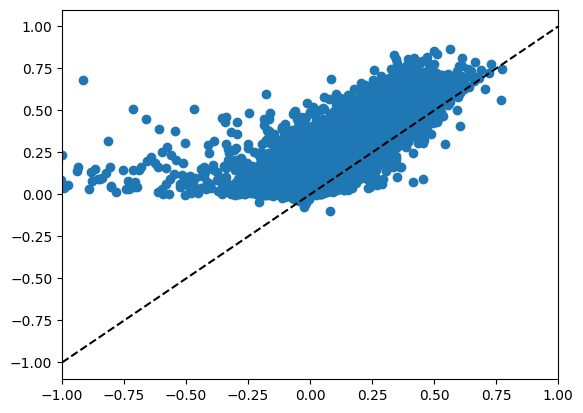

In [9]:
import matplotlib.pyplot as plt
merged_converged_df = merged_df.filter(pl.col("converged"))
plt.plot(merged_converged_df['cv_r2'], merged_converged_df['cv_test_fullmodel'], 'o')
plt.xlim(-1, 1)
plt.plot([-1, 1], [-1, 1], 'k--')

In [10]:
merged_df = merged_df.with_columns(
    (pl.col("delta_r2") / pl.col("cv_r2")).alias("delta_over_cv")
)

structure,mean_delta_over_cv,mean_cv_r2,mean_delta_r2,n_units
str,f64,f64,f64,u32
"""SCiw""",0.147807,0.14898,0.014099,332
"""VM""",0.147382,0.047488,0.005753,102
"""ACAd""",0.140484,0.079677,0.009841,573
"""VISal""",0.128832,0.075033,0.00887,110
"""VISp""",0.123776,0.076643,0.009836,770
…,…,…,…,…
"""OLF""",0.027831,0.050117,0.002272,152
"""MOp""",0.022815,0.091651,0.002262,1128
"""SSp""",0.018738,0.078369,0.001784,2075


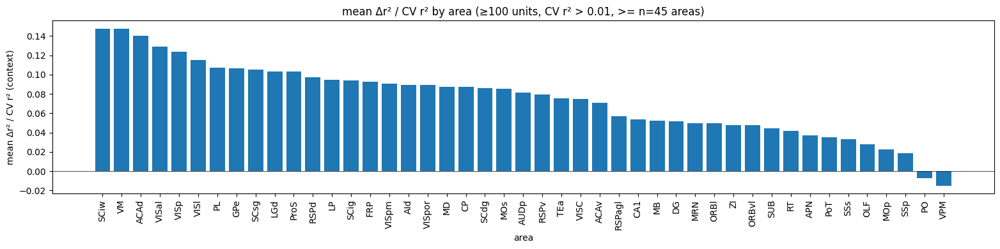

In [12]:
import matplotlib.pyplot as plt
unit_threshold = 100
cv2_thresh = 0.01
area_delta_r2 = (
    merged_df
    .filter(pl.col("converged"))
    .filter(pl.col("cv_r2") > cv2_thresh)  # to avoid extreme ratios from tiny cv_r2 values
    .drop_nulls("structure")
    .group_by("structure")
    .agg(
        pl.col("delta_over_cv").mean().alias("mean_delta_over_cv"),
        pl.col('cv_r2').mean().alias("mean_cv_r2"),
        pl.col("delta_r2").mean().alias("mean_delta_r2"),
        pl.len().alias("n_units"),
    )
    .filter(pl.col("n_units") >= unit_threshold)
    .sort("mean_delta_over_cv", descending=True)
)

display(area_delta_r2)
fig, ax = plt.subplots(figsize=(max(6, 0.35 * area_delta_r2.height), 4))
ax.bar(area_delta_r2["structure"], area_delta_r2["mean_delta_over_cv"])
ax.axhline(0, color="k", lw=0.5)
ax.set_xticks(range(area_delta_r2.height))
ax.set_xticklabels(area_delta_r2["structure"], rotation=90)
ax.set_ylabel("mean Δr² / CV r² (context)")
ax.set_xlabel("area")
ax.set_title(f"mean Δr² / CV r² by area (≥{unit_threshold} units, CV r² > {cv2_thresh}, >= n={area_delta_r2.height} areas)")
fig.tight_layout()
plt.show()


structure,kernel_context_baseline_mean,mean_cv_r2,mean_delta_r2,n_units
str,f64,f64,f64,u32
"""GPe""",0.03903,0.128471,0.012026,130
"""SCiw""",0.038453,0.14898,0.014099,332
"""SCig""",0.029006,0.102463,0.010582,279
"""MRN""",0.02796,0.169908,0.007263,599
"""SCdg""",0.024969,0.137554,0.007788,102
…,…,…,…,…
"""PL""",0.015739,0.07499,0.007912,307
"""ACAv""",0.015573,0.047605,0.003287,162
"""LGd""",0.01542,0.032486,0.003528,147


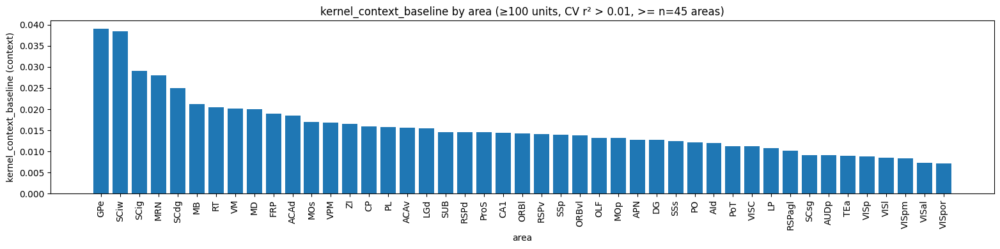

In [43]:
import matplotlib.pyplot as plt
unit_threshold = 100
cv2_thresh = 0.01

merged_converged_df["kernel_context_baseline"].list.mean().to_numpy()

area_delta_r2 = (
    merged_df
    .filter(pl.col("converged"))
    .filter(pl.col("cv_r2") > cv2_thresh)  # to avoid extreme ratios from tiny cv_r2 values
    .drop_nulls("structure")
    .group_by("structure")
    .agg(
        pl.col("kernel_context_baseline").list.mean().abs().mean().alias("kernel_context_baseline_mean"),
        pl.col('cv_r2').mean().alias("mean_cv_r2"),
        pl.col("delta_r2").mean().alias("mean_delta_r2"),
        pl.len().alias("n_units"),
    )
    .filter(pl.col("n_units") >= unit_threshold)
    .sort("kernel_context_baseline_mean", descending=True)
)

display(area_delta_r2.head(20))
fig, ax = plt.subplots(figsize=(max(6, 0.35 * area_delta_r2.height), 4))
ax.bar(area_delta_r2["structure"], area_delta_r2["kernel_context_baseline_mean"])
ax.axhline(0, color="k", lw=0.5)
ax.set_xticks(range(area_delta_r2.height))
ax.set_xticklabels(area_delta_r2["structure"], rotation=90)
ax.set_ylabel("kernel_context_baseline (context)")
ax.set_xlabel("area")
ax.set_title(f"kernel_context_baseline by area (≥{unit_threshold} units, CV r² > {cv2_thresh}, >= n={area_delta_r2.height} areas)")
fig.tight_layout()
plt.show()


structure,gain_is_vis_target_context_mean,mean_cv_r2,mean_delta_r2,n_units
str,f64,f64,f64,u32
"""PAL""",0.166596,0.114028,0.011824,57
"""SNr""",0.157305,0.141057,0.007401,72
"""GPe""",0.153574,0.128471,0.012026,130
"""VL""",0.142277,0.115097,0.025623,39
"""GPi""",0.141645,0.110512,0.01047,38
…,…,…,…,…
"""AON""",0.036511,0.03874,0.000733,69
"""AUDp""",0.036196,0.080025,0.008542,175
"""VISC""",0.029786,0.084073,0.005275,132


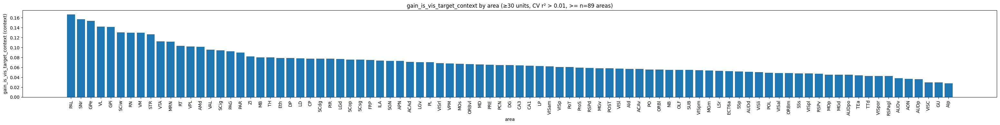

structure,gain_is_aud_target_context_mean,mean_cv_r2,mean_delta_r2,n_units
str,f64,f64,f64,u32
"""GPi""",0.236425,0.110512,0.01047,38
"""GPe""",0.223121,0.128471,0.012026,130
"""SNr""",0.196067,0.141057,0.007401,72
"""VTA""",0.143343,0.048445,0.006622,31
"""PAL""",0.131356,0.114028,0.011824,57
…,…,…,…,…
"""VISp""",0.032987,0.076643,0.009836,770
"""VISl""",0.031352,0.072067,0.008204,255
"""VISli""",0.029863,0.068299,0.007383,99


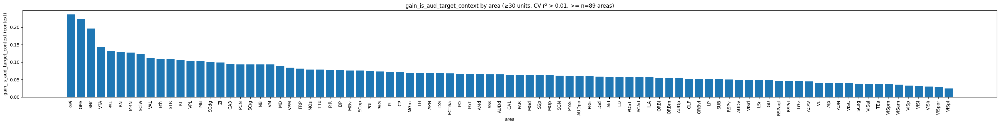

structure,gain_rewards_context_mean,mean_cv_r2,mean_delta_r2,n_units
str,f64,f64,f64,u32
"""RN""",1.025621,0.112904,0.004616,85
"""RT""",1.004474,0.127478,0.006196,177
"""SNr""",0.780108,0.141057,0.007401,72
"""GPe""",0.741751,0.128471,0.012026,130
"""ECT6a""",0.664569,0.058324,0.017349,30
…,…,…,…,…
"""SCop""",0.188668,0.085101,0.008591,45
"""POST""",0.179663,0.058184,0.002976,34
"""LSr""",0.175748,0.037316,0.00294,60


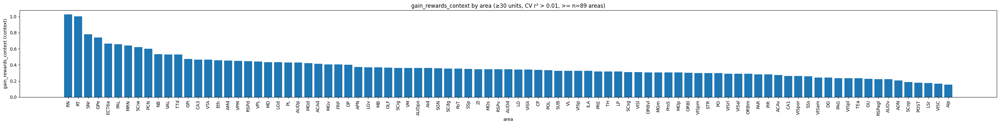

structure,gain_licks_context_mean,mean_cv_r2,mean_delta_r2,n_units
str,f64,f64,f64,u32
"""SNr""",0.08984,0.141057,0.007401,72
"""NB""",0.081687,0.095747,0.004114,31
"""GPe""",0.071739,0.128471,0.012026,130
"""TTd""",0.071271,0.049065,0.001915,30
"""RN""",0.066793,0.112904,0.004616,85
…,…,…,…,…
"""RSPv""",0.024673,0.037662,0.002246,120
"""VISl""",0.024652,0.072067,0.008204,255
"""VISam""",0.024047,0.073065,0.0087,76


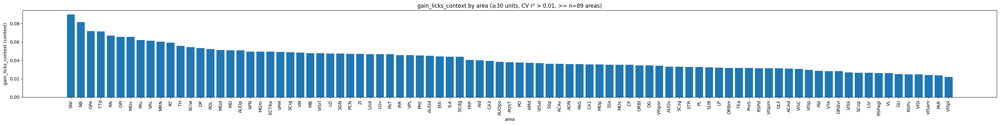

structure,gain_is_hit_context_mean,mean_cv_r2,mean_delta_r2,n_units
str,f64,f64,f64,u32
"""GPe""",0.793537,0.128471,0.012026,130
"""LGv""",0.735736,0.058965,0.010679,65
"""SNr""",0.682548,0.141057,0.007401,72
"""SCiw""",0.622461,0.14898,0.014099,332
"""VL""",0.587362,0.115097,0.025623,39
…,…,…,…,…
"""SSs""",0.215834,0.075853,0.002679,944
"""VISC""",0.210178,0.084073,0.005275,132
"""GU""",0.203239,0.06973,0.003477,42


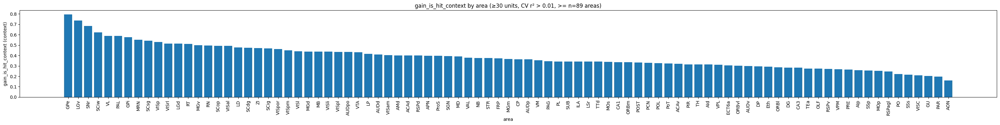

In [32]:
import matplotlib.pyplot as plt
unit_threshold = 30
cv2_thresh = 0.01

for col in ["gain_is_vis_target_context", "gain_is_aud_target_context", "gain_rewards_context", "gain_licks_context", 'gain_is_hit_context']:
    area_delta_r2 = (
        merged_df
        .filter(pl.col("converged"))
        .filter(pl.col("cv_r2") > cv2_thresh)  # to avoid extreme ratios from tiny cv_r2 values
        .drop_nulls("structure")
        .group_by("structure")
        .agg(
            pl.col(col).abs().mean().alias(f"{col}_mean"),
            pl.col('cv_r2').mean().alias("mean_cv_r2"),
            pl.col("delta_r2").mean().alias("mean_delta_r2"),
            pl.len().alias("n_units"),
        )
        .filter(pl.col("n_units") >= unit_threshold)
        .sort(f"{col}_mean", descending=True)
    )

    display(area_delta_r2)
    fig, ax = plt.subplots(figsize=(max(6, 0.35 * area_delta_r2.height), 4))
    ax.bar(area_delta_r2["structure"], area_delta_r2[f"{col}_mean"])
    ax.axhline(0, color="k", lw=0.5)
    ax.set_xticks(range(area_delta_r2.height))
    ax.set_xticklabels(area_delta_r2["structure"], rotation=90)
    ax.set_ylabel(f"{col} (context)")
    ax.set_xlabel("area")
    ax.set_title(f"{col} by area (≥{unit_threshold} units, CV r² > {cv2_thresh}, >= n={area_delta_r2.height} areas)")
    fig.tight_layout()
    plt.show()


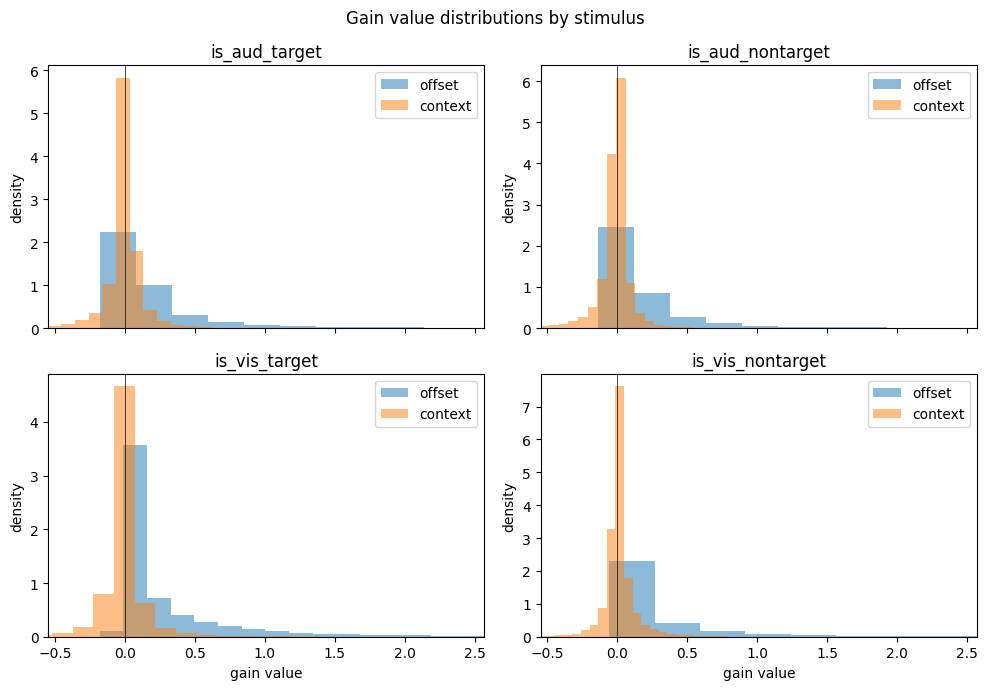

In [ ]:
# Distributions of gain values for each stimulus.
# Each gain-modulated predictor has an `offset` (baseline gain) and a `context`
# term (how context shifts that gain); plot both per stimulus.
import numpy as np

stimuli = ["is_aud_target", "is_aud_nontarget", "is_vis_target", "is_vis_nontarget"]
gain_kinds = ["offset", "context"]

fig, axes = plt.subplots(2, 2, figsize=(10, 7), sharex=True)
for ax, stim in zip(axes.flat, stimuli):
    for kind in gain_kinds:
        vals = gain_glm_df[f"gain_{stim}_{kind}"].to_numpy()
        vals = vals[np.isfinite(vals)]
        ax.hist(vals, bins=80, alpha=0.5, density=True, label=kind)
    ax.axvline(0, color="k", lw=0.5)
    ax.set_title(stim)
    ax.set_ylabel("density")
    ax.legend()

# clip x to the central 99% across all plotted gains so outliers don't squash it
allvals = np.concatenate([
    gain_glm_df[f"gain_{s}_{k}"].to_numpy() for s in stimuli for k in gain_kinds
])
lo, hi = np.nanpercentile(allvals, [0.5, 99.5])
axes.flat[0].set_xlim(lo, hi)
for ax in axes[-1]:
    ax.set_xlabel("gain value")
fig.suptitle("Gain value distributions by stimulus")
fig.tight_layout()
plt.show()


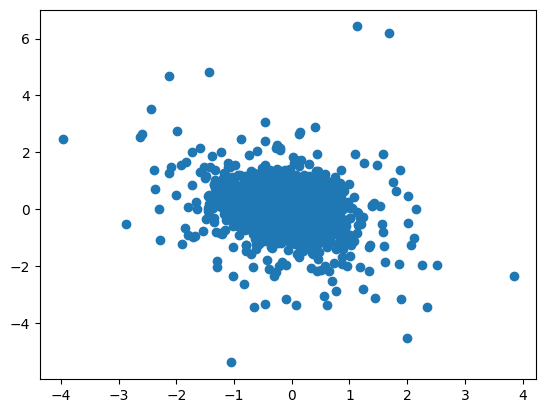

In [ ]:
plt.plot(merged_converged_df['gain_is_aud_target_context'], merged_converged_df['gain_is_vis_target_context'], 'o')

Text(0, 0.5, 'gain_is_vis_target_context')

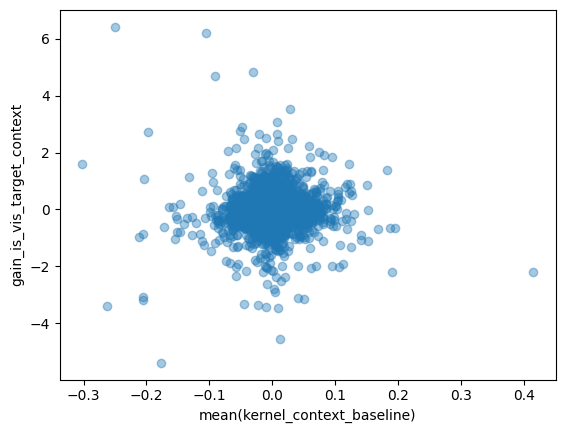

In [ ]:
x = merged_converged_df["kernel_context_baseline"].list.mean().to_numpy()
y = merged_converged_df["gain_is_vis_target_context"].to_numpy()

mask = np.isfinite(x) & np.isfinite(y)
plt.plot(x[mask], y[mask], "o", alpha=0.4)
plt.xlabel("mean(kernel_context_baseline)")
plt.ylabel("gain_is_vis_target_context")

In [53]:
# Spot-check a unit's response, split by task context.
# Ten panels: the four stimuli, the four behavioral outcomes
# (hit/miss/correct-reject/false-alarm), then reward- and lick-triggered PETHs.
# Black = vis-rewarded context, orange = aud-rewarded context.
# Each subplot title also shows that event's fitted gain (offset + context).
import numpy as np
import matplotlib.pyplot as plt
import lazynwb

NWB_CACHE = "s3://aind-scratch-data/dynamic-routing/cache/nwb/v0.0.272"


def _nwb_path_for(session_id: str) -> str:
    """Look up the session's NWB path from `df`, else build the cache path."""
    hit = df.filter(pl.col("session_id") == session_id)
    return hit["nwb_path"][0] if hit.height else f"{NWB_CACHE}/{session_id}.nwb"


def _peth(spike_times, event_times, window, bin_size):
    """Mean firing rate (Hz) and SEM in bins relative to each event."""
    edges = np.arange(window[0], window[1] + bin_size, bin_size)
    centers = edges[:-1] + bin_size / 2
    event_times = np.asarray(event_times, dtype=float)
    if event_times.size == 0:
        nan = np.full(centers.shape, np.nan)
        return centers, nan, nan
    spike_times = np.sort(spike_times)
    i0 = np.searchsorted(spike_times, event_times + window[0])
    i1 = np.searchsorted(spike_times, event_times + window[1])
    counts = np.empty((event_times.size, centers.size))
    for k in range(event_times.size):
        rel = spike_times[i0[k]:i1[k]] - event_times[k]
        counts[k] = np.histogram(rel, bins=edges)[0]
    rate = counts / bin_size
    return centers, rate.mean(0), rate.std(0) / np.sqrt(event_times.size)


def _draw(ax, spike_times, ev_vis, ev_aud, window, bin_size, title):
    for ev, color, lab in [(ev_vis, "k", "vis-rewarded"),
                           (ev_aud, "tab:orange", "aud-rewarded")]:
        c, m, s = _peth(spike_times, ev, window, bin_size)
        ax.plot(c, m, color=color, lw=1.5, label=f"{lab} (n={len(ev)})")
        ax.fill_between(c, m - s, m + s, color=color, alpha=0.2, linewidth=0)
    ax.axvline(0, color="gray", lw=0.5, ls="--")
    ax.set_title(title)
    ax.set_xlabel("time from event (s)")
    ax.set_ylabel("rate (Hz)")
    ax.legend(fontsize=7, frameon=False)


def plot_unit_response(unit_id, *, bin_size=0.05,
                       stim_window=(-0.5, 1.0),
                       reward_window=(-0.5, 1.5),
                       lick_window=(-0.5, 0.5)):
    session_id = unit_id.rsplit("_", 1)[0]
    nwb_path = _nwb_path_for(session_id)

    urow = merged_df.filter(pl.col("unit_id") == unit_id)
    structure = urow["structure"][0] if urow.height else None

    def gain_title(name):
        """Panel title: event name + its fitted offset / context gain."""
        if not urow.height:
            return name
        if f"gain_{name}_offset" not in urow.columns:
            return name
        o = urow[f"gain_{name}_offset"][0]
        c = urow[f"gain_{name}_context"][0]
        return f"{name}\noffset={o:+.3f}, context={c:+.3f}"

    # unit spike train
    spike_times = (
        lazynwb.scan_nwb(nwb_path, "/units")
        .filter(pl.col("unit_id") == unit_id)
        .select("spike_times")
        .collect()["spike_times"][0]
        .to_numpy()
    )

    trials = lazynwb.read_nwb(nwb_path, "/intervals/trials")
    # is_vis_rewarded == True  -> vis-rewarded context (black)
    #                  == False -> aud-rewarded context (orange)
    trial_starts = trials["start_time"].to_numpy()
    trial_is_vis = trials["is_vis_rewarded"].to_numpy().astype(bool)

    def split_by_context(event_times):
        """Assign each event to the context of the trial it falls within."""
        event_times = np.asarray(event_times, dtype=float)
        idx = np.searchsorted(trial_starts, event_times, side="right") - 1
        valid = idx >= 0
        is_vis = np.zeros(event_times.size, dtype=bool)
        is_vis[valid] = trial_is_vis[idx[valid]]
        return event_times[valid & is_vis], event_times[valid & ~is_vis]

    def stim_triggered(col):
        """stim_start_time of `col`-True trials, split by the trial's context."""
        ev_vis = (trials.filter(pl.col(col) & pl.col("is_vis_rewarded"))
                  ["stim_start_time"].drop_nulls().to_numpy())
        ev_aud = (trials.filter(pl.col(col) & ~pl.col("is_vis_rewarded"))
                  ["stim_start_time"].drop_nulls().to_numpy())
        return ev_vis, ev_aud

    fig, axes = plt.subplots(3, 4, figsize=(18, 11))
    axes = axes.flat

    # panels 1-4: stimulus-triggered, context = the trial's own context
    stim_cols = ["is_aud_target", "is_aud_nontarget",
                 "is_vis_target", "is_vis_nontarget"]
    for ax, col in zip(axes, stim_cols):
        ev_vis, ev_aud = stim_triggered(col)
        _draw(ax, spike_times, ev_vis, ev_aud, stim_window, bin_size, gain_title(col))

    # panels 5-8: behavioral-outcome-triggered. These predictors are also
    # aligned to stim_start_time in the model, so plot them the same way.
    outcome_cols = ["is_hit", "is_miss", "is_correct_reject", "is_false_alarm"]
    for ax, col in zip(axes[4:8], outcome_cols):
        ev_vis, ev_aud = stim_triggered(col)
        _draw(ax, spike_times, ev_vis, ev_aud, stim_window, bin_size, gain_title(col))

    # panel 9: reward-triggered
    reward_times = (
        lazynwb.scan_nwb(nwb_path, "/processing/behavior/rewards")
        .select("timestamps").collect().to_numpy().flatten()
    )
    _draw(axes[8], spike_times, *split_by_context(reward_times),
          reward_window, bin_size, gain_title("rewards"))

    # panel 10: lick-triggered
    lick_times = (
        lazynwb.scan_nwb(nwb_path, "/processing/behavior/licks")
        .select("timestamps").collect().to_numpy().flatten()
    )
    _draw(axes[9], spike_times, *split_by_context(lick_times),
          lick_window, bin_size, gain_title("licks"))

    # hide the unused panels in the 3x4 grid
    for ax in axes[10:]:
        ax.axis("off")

    fig.suptitle(f"{unit_id}  |  structure: {structure}")
    fig.tight_layout()
    return fig

def plot_target_responses_and_rasters(unit_id, *, bin_size=0.05,
                                      stim_window=(-0.5, 1.0)):
    session_id = unit_id.rsplit("_", 1)[0]
    nwb_path = _nwb_path_for(session_id)

    urow = merged_df.filter(pl.col("unit_id") == unit_id)
    structure = urow["structure"][0] if urow.height else None

    def gain_title(name, label):
        if not urow.height:
            return label
        if f"gain_{name}_offset" not in urow.columns:
            return label
        o = urow[f"gain_{name}_offset"][0]
        c = urow[f"gain_{name}_context"][0]
        return f"{label}\noffset={o:+.3f}, context={c:+.3f}"

    spike_times = (
        lazynwb.scan_nwb(nwb_path, "/units")
        .filter(pl.col("unit_id") == unit_id)
        .select("spike_times")
        .collect()["spike_times"][0]
        .to_numpy()
    )
    spike_times = np.sort(spike_times)

    trials = lazynwb.read_nwb(nwb_path, "/intervals/trials")

    def target_trials(col):
        target = (
            trials
            .filter(pl.col(col))
            .filter(~pl.col("is_instruction"))
            .select(["stim_start_time", "is_vis_rewarded"])
            .drop_nulls("stim_start_time")
            .sort("stim_start_time")
        )
        event_times = target["stim_start_time"].to_numpy()
        is_vis_rewarded = target["is_vis_rewarded"].to_numpy().astype(bool)
        return event_times, is_vis_rewarded

    def draw_psth(ax, event_times, is_vis_rewarded, title):
        ymax = 0.0
        for ev, color, lab in [
            (event_times[~is_vis_rewarded], "tab:orange", "aud-rewarded"),
            (event_times[is_vis_rewarded], "k", "vis-rewarded"),
        ]:
            c, m, s = _peth(spike_times, ev, stim_window, bin_size)
            ax.plot(c, m, color=color, lw=1.5, label=f"{lab} (n={len(ev)})")
            ax.fill_between(c, m - s, m + s, color=color, alpha=0.2, linewidth=0)
            upper = m + s
            if np.isfinite(upper).any():
                ymax = max(ymax, np.nanmax(upper))
        ax.axvline(0, color="gray", lw=0.5, ls="--")
        ax.set_title(title)
        ax.set_ylabel("rate (Hz)")
        ax.legend(fontsize=7, frameon=False)
        #ax.axvline(0.1, color='k', ls='dotted')
        return ymax

    def draw_raster(ax, event_times, is_vis_rewarded, title):
        n_trials = event_times.size
        for row, (ev, vis_rewarded) in enumerate(zip(event_times, is_vis_rewarded), start=1):
            if vis_rewarded:
                ax.axhspan(row - 0.5, row + 0.5, color="0.92", linewidth=0, zorder=0)
            i0 = np.searchsorted(spike_times, ev + stim_window[0])
            i1 = np.searchsorted(spike_times, ev + stim_window[1])
            rel = spike_times[i0:i1] - ev
            if rel.size:
                ax.vlines(rel, row - 0.38, row + 0.38, color="k", lw=0.75, zorder=2)
        ax.axvline(0, color="gray", lw=0.5, ls="--", zorder=1)
        ax.set_title(title)
        ax.set_xlim(stim_window)
        ax.set_ylim(0.5, max(n_trials, 1) + 0.5)
        ax.invert_yaxis()
        ax.set_xlabel("time from stimulus (s)")
        ax.set_ylabel("trial")

    aud_events, aud_is_vis = target_trials("is_aud_target")
    vis_events, vis_is_vis = target_trials("is_vis_target")

    fig, axes = plt.subplots(
        2, 2, figsize=(11, 8), sharex=True,
        gridspec_kw={"height_ratios": [1.0, 1.5]},
    )
    ax_aud_psth, ax_vis_psth = axes[0]
    ax_aud_raster, ax_vis_raster = axes[1]

    aud_ymax = draw_psth(
        ax_aud_psth, aud_events, aud_is_vis,
        gain_title("is_aud_target", "auditory target"),
    )
    vis_ymax = draw_psth(
        ax_vis_psth, vis_events, vis_is_vis,
        gain_title("is_vis_target", "visual target"),
    )
    psth_ymax = max(aud_ymax, vis_ymax)
    if not np.isfinite(psth_ymax) or psth_ymax <= 0:
        psth_ymax = 1.0
    for ax in (ax_aud_psth, ax_vis_psth):
        ax.set_xlim(stim_window)
        ax.set_ylim(-0.5, psth_ymax * 1.05)
        ax.set_xlabel("time from stimulus (s)")

    draw_raster(ax_aud_raster, aud_events, aud_is_vis, "auditory target trials")
    draw_raster(ax_vis_raster, vis_events, vis_is_vis, "visual target trials")

    fig.suptitle(f"{unit_id}  |  structure: {structure}")
    fig.tight_layout()
    return fig


In [ ]:
# example: the converged unit with the largest |vis-target context gain|
example_uid = (
    merged_df.filter(pl.col("converged"))
    .sort(pl.col("gain_is_vis_target_context").abs(), descending=True)
    ["unit_id"][0]
)
print("example unit:", example_uid)
plot_unit_response(example_uid)
plt.show()


example unit: 666986_2023-08-15_E-301


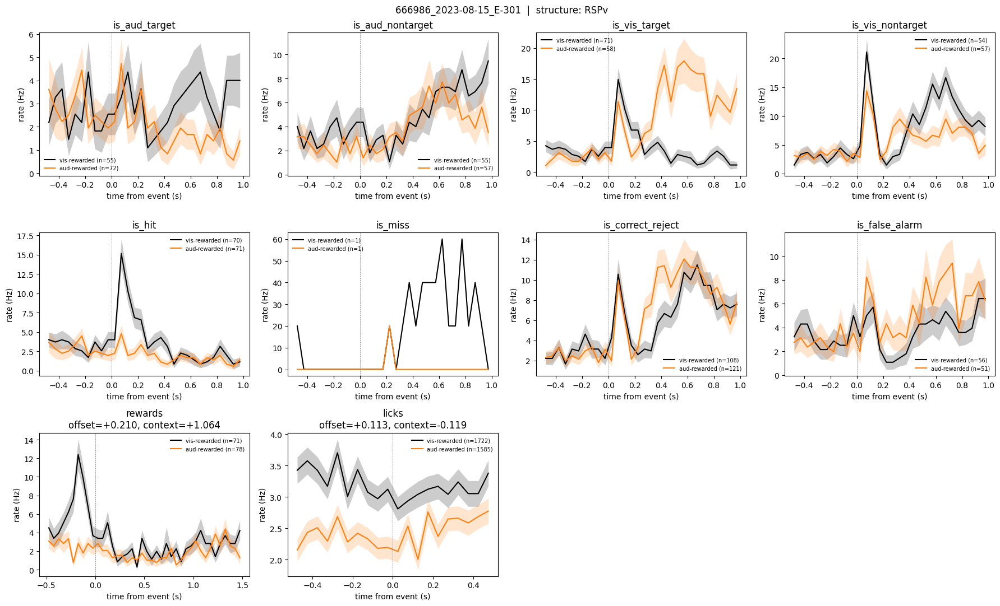

In [97]:
# example: the converged unit with the largest |vis-target context gain|
example_uid = (
    merged_df.filter(pl.col("converged"))
    .filter(pl.col("cv_r2") > 0.01)  # to avoid extreme ratios from tiny cv_r2 values
    .filter(pl.col('structure')=='RSPv')
    .sort(pl.col("delta_r2_stim_early"), descending=True)
    ["unit_id"][3]
)
print("example unit:", example_uid)
plot_unit_response(example_uid)
plt.show()


In [11]:
# ============================================================
# Δr² by area: compare context metrics across regions
# ============================================================
# Which delta_r2 metrics to plot (one bar graph each). Each is normalized
# per-unit by cv_r2 -> the fraction of the model's cross-validated explainable
# variance attributable to that context term. This controls for the fact that
# areas with better overall fits (higher cv_r2) would tend to have larger raw
# delta_r2 even if context modulation were identical.
DELTA_R2_COLS = [
    "delta_r2",             # dropping all context terms
    "delta_r2_stim_early",  # context x stimulus, early window
    "delta_r2_stim_late",   # context x stimulus, late window
]

CV2_THRESH = 0.05      # keep only units whose full-model cv_r2 exceeds this
UNIT_THRESHOLD = 50   # keep only areas with at least this many qualifying units

# area acronym -> "#RRGGBB" from the CCF structure tree
CCF_COLORS = {
    a: f"#{c}"
    for a, c in zip(structure_tree["acronym"], structure_tree["color_hex_triplet"])
}

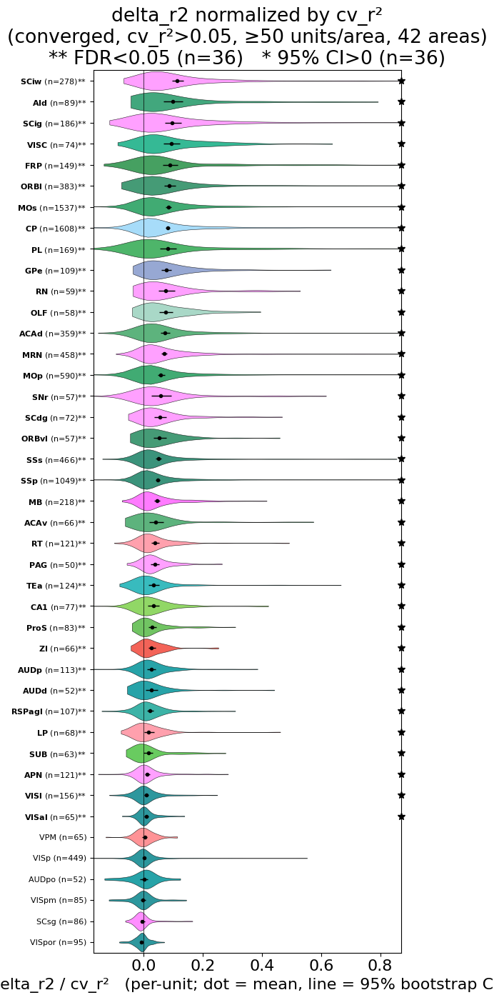

delta_r2: significantly > 0 (FDR<0.05): ['SCiw', 'AId', 'SCig', 'VISC', 'FRP', 'ORBl', 'MOs', 'CP', 'PL', 'GPe', 'RN', 'OLF', 'ACAd', 'MRN', 'MOp', 'SNr', 'SCdg', 'ORBvl', 'SSs', 'SSp', 'MB', 'ACAv', 'RT', 'PAG', 'TEa', 'CA1', 'ProS', 'ZI', 'AUDp', 'AUDd', 'RSPagl', 'LP', 'SUB', 'APN', 'VISl', 'VISal']


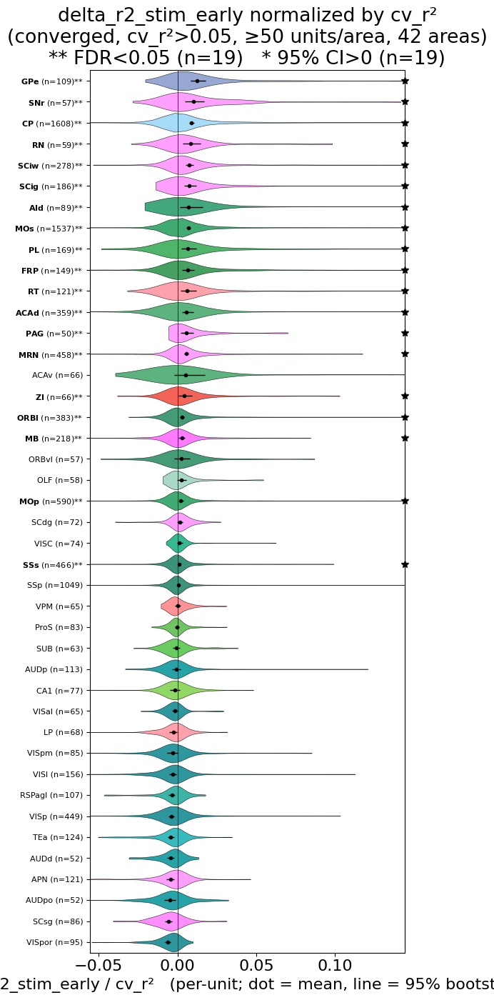

delta_r2_stim_early: significantly > 0 (FDR<0.05): ['GPe', 'SNr', 'CP', 'RN', 'SCiw', 'SCig', 'AId', 'MOs', 'PL', 'FRP', 'RT', 'ACAd', 'PAG', 'MRN', 'ZI', 'ORBl', 'MB', 'MOp', 'SSs']


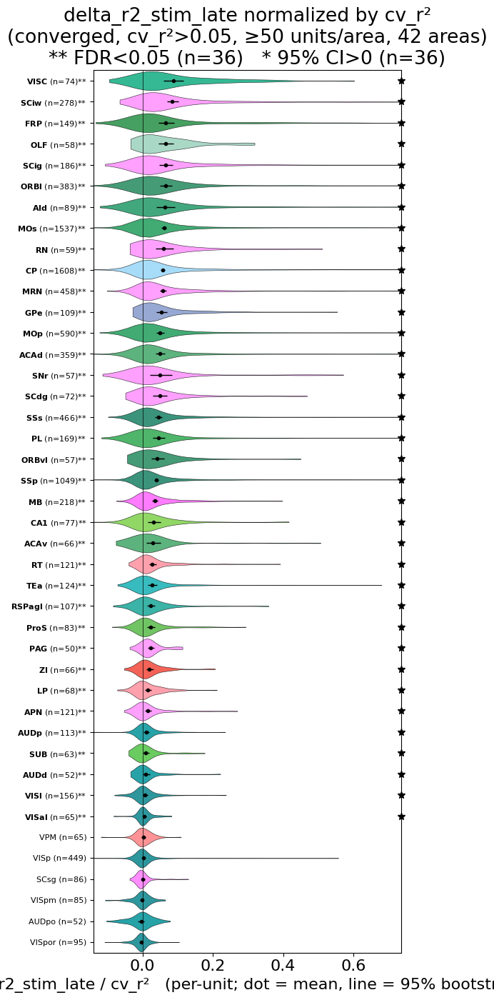

delta_r2_stim_late: significantly > 0 (FDR<0.05): ['VISC', 'SCiw', 'FRP', 'OLF', 'SCig', 'ORBl', 'AId', 'MOs', 'RN', 'CP', 'MRN', 'GPe', 'MOp', 'ACAd', 'SNr', 'SCdg', 'SSs', 'PL', 'ORBvl', 'SSp', 'MB', 'CA1', 'ACAv', 'RT', 'TEa', 'RSPagl', 'ProS', 'PAG', 'ZI', 'LP', 'APN', 'AUDp', 'SUB', 'AUDd', 'VISl', 'VISal']


In [12]:
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams["font.size"] = 16

# Benjamini-Hochberg: returns boolean mask of which p-values are significant at FDR=q
def bh_significant(pvals, q=0.05):
    p = np.asarray(pvals, dtype=float)
    m = p.size
    order = np.argsort(p)
    thresh = (np.arange(1, m + 1) / m) * q
    passed = p[order] <= thresh
    keep = np.zeros(m, dtype=bool)
    if passed.any():
        kmax = np.max(np.where(passed)[0])      # largest rank passing BH
        keep[order[: kmax + 1]] = True
    return keep

# Percentile bootstrap over units: resample units with replacement N_BOOT times,
# take the mean each time. Returns the 2.5/97.5 percentiles of the resampled
# means (the 95% CI) and a one-sided p-value = fraction of resampled means <= 0.
def bootstrap_mean(vals, n_boot, rng):
    n = vals.size
    idx = rng.integers(0, n, size=(n_boot, n))
    boot_means = vals[idx].mean(axis=1)
    lo, hi = np.percentile(boot_means, [2.5, 97.5])
    p_le0 = float(np.mean(boot_means <= 0.0))
    return lo, hi, p_le0

FDR_Q = 0.05      # false-discovery rate for the "significantly > 0" call across areas
N_BOOT = 5000     # bootstrap resamples per area
BOOT_SEED = 0     # reproducible resampling

# units passing QC: converged fit AND cv_r2 above threshold
base = (
    merged_df
    .filter(pl.col("converged"))
    .filter(pl.col("cv_r2") > CV2_THRESH)
    .drop_nulls("structure")
)

for col in DELTA_R2_COLS:
    norm = f"{col}__over_cv"
    area = (
        base
        .with_columns((pl.col(col) / pl.col("cv_r2")).alias(norm))
        .drop_nulls(norm)
        .group_by("structure")
        .agg(
            pl.col(norm).alias("vals"),        # per-unit values for the violin
            pl.col(norm).mean().alias("mean"),
            pl.len().alias("n_units"),
        )
        .filter(pl.col("n_units") >= UNIT_THRESHOLD)
        .sort("mean", descending=True)
    )

    structures = area["structure"].to_list()
    values = [np.asarray(v, dtype=float) for v in area["vals"].to_list()]
    means = area["mean"].to_numpy()
    n_units = area["n_units"].to_list()
    colors = [CCF_COLORS.get(s, "#999999") for s in structures]

    # percentile-bootstrap 95% CI of the mean + one-sided p-value, per area
    rng = np.random.default_rng(BOOT_SEED)
    ci_lo = np.empty(len(values))
    ci_hi = np.empty(len(values))
    p_le0 = np.empty(len(values))
    for i, v in enumerate(values):
        ci_lo[i], ci_hi[i], p_le0[i] = bootstrap_mean(v, N_BOOT, rng)

    # significance that the mean is > 0
    sig_nominal = ci_lo > 0                              # bootstrap 95% CI excludes 0
    sig_fdr = bh_significant(p_le0, q=FDR_Q) & (means > 0)

    # label decoration: ** survives FDR, * nominal only; bold if either
    labels = []
    for s, n, sn, sf in zip(structures, n_units, sig_nominal, sig_fdr):
        mark = "**" if sf else ("*" if sn else "")
        labels.append(f"$\\bf{{{s}}}$ (n={n}){mark}" if mark else f"{s} (n={n})")

    y = np.arange(len(structures))
    fig, ax = plt.subplots(figsize=(6, max(3, 0.34 * len(structures))))

    parts = ax.violinplot(values, positions=y, vert=False, widths=0.9,
                          showextrema=False, showmeans=False, showmedians=False)
    for body, c in zip(parts["bodies"], colors):
        body.set_facecolor(c)
        body.set_edgecolor("k")
        body.set_linewidth(0.4)
        body.set_alpha(0.85)

    # overlay mean (dot) + 95% bootstrap CI (line) across units
    ax.hlines(y, ci_lo, ci_hi, color="k", lw=1.0, zorder=3)
    ax.plot(means, y, "o", color="k", ms=3, zorder=4)

    # the ratios are heavy-tailed; clip the view to the central 99% so the
    # bulk of each distribution is legible (violins still use the full data)
    pooled = np.concatenate(values)
    lo, hi = np.nanpercentile(pooled, [0.5, 99.5])
    pad = 0.05 * (hi - lo)
    xlo, xhi = min(lo, 0.0) - pad, hi + pad
    ax.set_xlim(xlo, xhi)

    # star at the right margin for areas significant above 0 (FDR)
    for yi, sf in zip(y, sig_fdr):
        if sf:
            ax.plot(xhi, yi, marker="*", color="k", markersize=7, clip_on=False)

    ax.set_yticks(y)
    ax.set_yticklabels(labels, fontsize=8)
    # bound y tightly to the violins (each spans ±0.45 around its row) so there's
    # no dead margin top/bottom; descending limits also put the largest mean on top
    ax.margins(y=0)
    ax.set_ylim(len(structures) - 0.5, -0.5)
    ax.axvline(0, color="k", lw=0.5)
    ax.set_xlabel(f"{col} / cv_r²   (per-unit; dot = mean, line = 95% bootstrap CI)")
    ax.set_title(
        f"{col} normalized by cv_r²\n"
        f"(converged, cv_r²>{CV2_THRESH}, ≥{UNIT_THRESHOLD} units/area, "
        f"{len(structures)} areas)\n"
        f"** FDR<{FDR_Q} (n={int(sig_fdr.sum())})   * 95% CI>0 (n={int(sig_nominal.sum())})"
    )
    fig.tight_layout()
    plt.show()

    print(f"{col}: significantly > 0 (FDR<{FDR_Q}): "
          f"{[s for s, sf in zip(structures, sig_fdr) if sf]}")

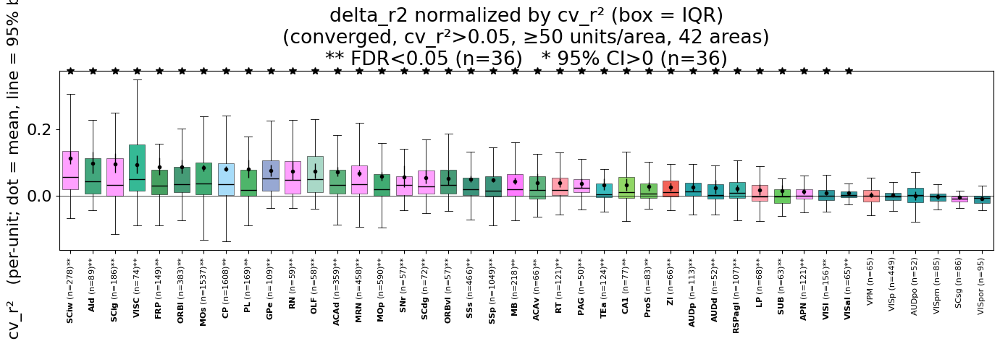

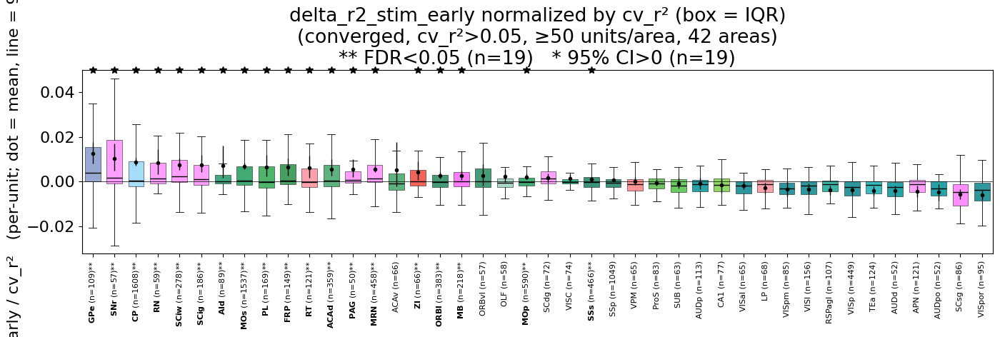

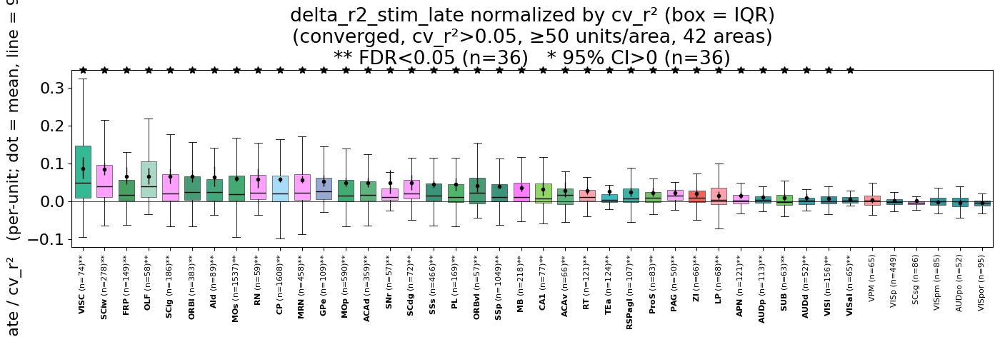

In [16]:
# Vertical box-plot version of the Δr²-by-area violins above.
# Reuses DELTA_R2_COLS, the QC thresholds, colors, and bootstrap helpers
# defined in the preceding cells.
for col in DELTA_R2_COLS:
    norm = f"{col}__over_cv"
    area = (
        base
        .with_columns((pl.col(col) / pl.col("cv_r2")).alias(norm))
        .drop_nulls(norm)
        .group_by("structure")
        .agg(
            pl.col(norm).alias("vals"),
            pl.col(norm).mean().alias("mean"),
            pl.len().alias("n_units"),
        )
        .filter(pl.col("n_units") >= UNIT_THRESHOLD)
        .sort("mean", descending=True)
    )

    structures = area["structure"].to_list()
    values = [np.asarray(v, dtype=float) for v in area["vals"].to_list()]
    means = area["mean"].to_numpy()
    n_units = area["n_units"].to_list()
    colors = [CCF_COLORS.get(s, "#999999") for s in structures]

    rng = np.random.default_rng(BOOT_SEED)
    ci_lo = np.empty(len(values))
    ci_hi = np.empty(len(values))
    p_le0 = np.empty(len(values))
    for i, v in enumerate(values):
        ci_lo[i], ci_hi[i], p_le0[i] = bootstrap_mean(v, N_BOOT, rng)

    sig_nominal = ci_lo > 0
    sig_fdr = bh_significant(p_le0, q=FDR_Q) & (means > 0)

    labels = []
    for s, n, sn, sf in zip(structures, n_units, sig_nominal, sig_fdr):
        mark = "**" if sf else ("*" if sn else "")
        labels.append(f"$\\bf{{{s}}}$ (n={n}){mark}" if mark else f"{s} (n={n})")

    x = np.arange(len(structures))
    fig, ax = plt.subplots(figsize=(max(6, 0.34 * len(structures)), 5))

    parts = ax.boxplot(
        values, positions=x, vert=True, widths=0.72, patch_artist=True,
        showfliers=False,
        medianprops={"color": "k", "linewidth": 1.0},
        whiskerprops={"color": "k", "linewidth": 0.6},
        capprops={"color": "k", "linewidth": 0.6},
    )
    for box, c in zip(parts["boxes"], colors):
        box.set_facecolor(c)
        box.set_edgecolor("k")
        box.set_linewidth(0.4)
        box.set_alpha(0.85)

    # Same mean (dot) and percentile-bootstrap 95% CI (line) as the violins.
    ax.vlines(x, ci_lo, ci_hi, color="k", lw=1.0, zorder=3)
    ax.plot(x, means, "o", color="k", ms=3, zorder=4)

    # Fit the view to the displayed whiskers and mean CIs.  Fliers are hidden,
    # so percentile limits of the full data would otherwise leave excess space.
    visible_y = np.concatenate([
        *(whisker.get_ydata() for whisker in parts["whiskers"]),
        ci_lo, ci_hi, means, [0.0],
    ])
    ylo, yhi = np.nanmin(visible_y), np.nanmax(visible_y)
    pad = max(0.05 * (yhi - ylo), 1e-6)
    ylo, yhi = ylo - pad, yhi + pad
    ax.set_ylim(ylo, yhi)

    for xi, sf in zip(x, sig_fdr):
        if sf:
            ax.plot(xi, yhi, marker="*", color="k", markersize=7, clip_on=False)

    ax.set_xticks(x)
    ax.set_xticklabels(labels, fontsize=8, rotation=90)
    ax.margins(x=0)
    ax.set_xlim(-0.5, len(structures) - 0.5)
    ax.axhline(0, color="k", lw=0.5)
    ax.set_ylabel(f"{col} / cv_r²   (per-unit; dot = mean, line = 95% bootstrap CI)")
    ax.set_title(
        f"{col} normalized by cv_r² (box = IQR)\n"
        f"(converged, cv_r²>{CV2_THRESH}, ≥{UNIT_THRESHOLD} units/area, "
        f"{len(structures)} areas)\n"
        f"** FDR<{FDR_Q} (n={int(sig_fdr.sum())})   * 95% CI>0 (n={int(sig_nominal.sum())})"
    )
    fig.tight_layout()
    plt.show()


unit_id,structure,cv_r2,delta_r2_stim_early,delta_r2_stim_late,late_minus_early
str,str,f64,f64,f64,f64
"""644867_2023-02-20_D-17""","""MRN""",0.424938,-0.000035,0.315666,0.3157
"""644864_2023-02-01_F-647""",null,0.461891,-0.000011,0.278232,0.278243
"""713655_2024-08-06_C-758""","""SSs""",0.21994,-0.000011,0.211343,0.211354
"""649943_2023-02-15_A-166""","""MOs""",0.070282,-0.000236,0.180147,0.180382


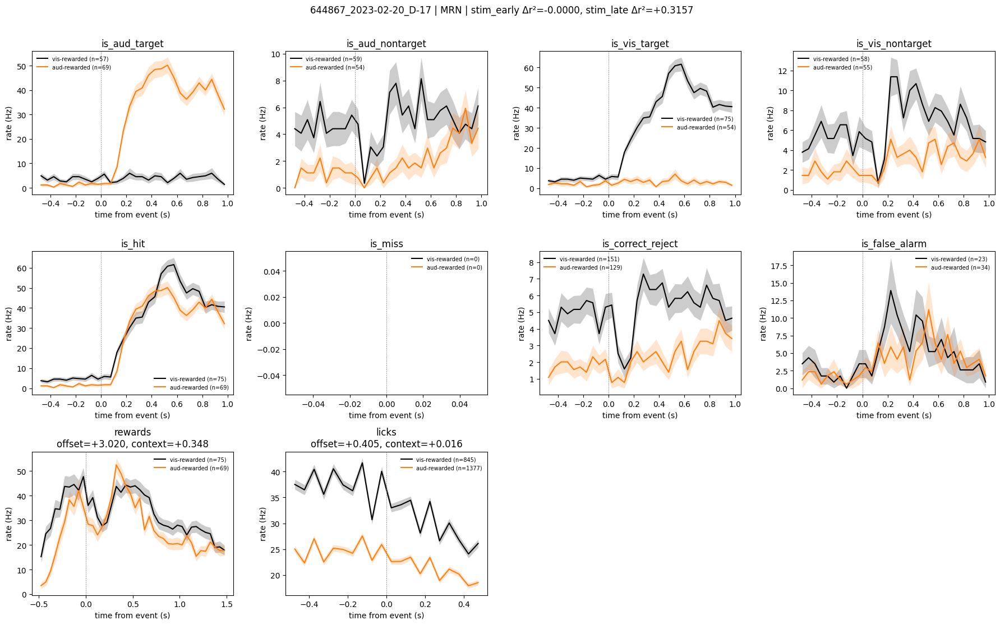

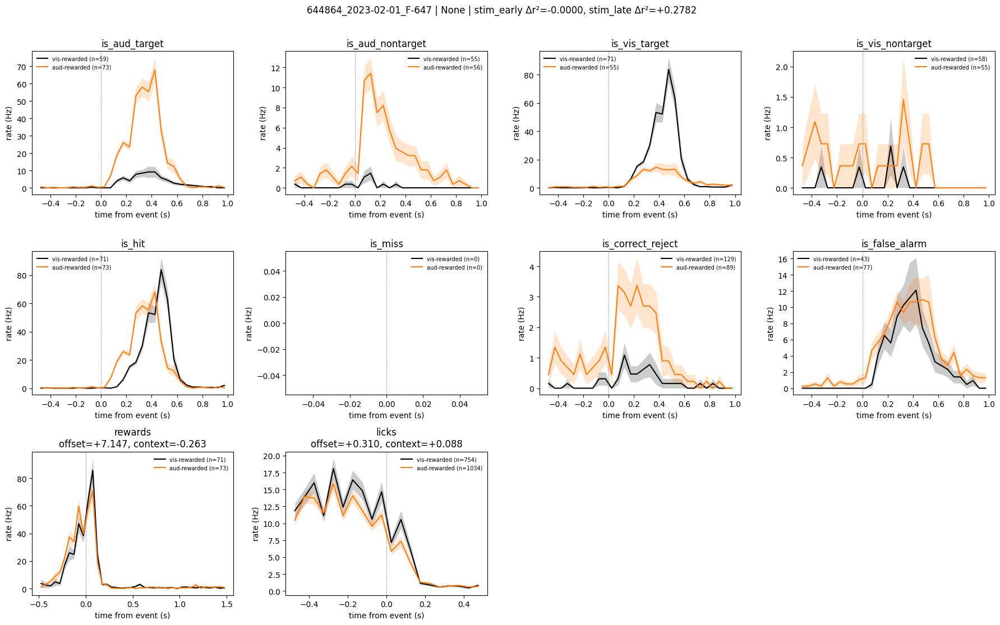

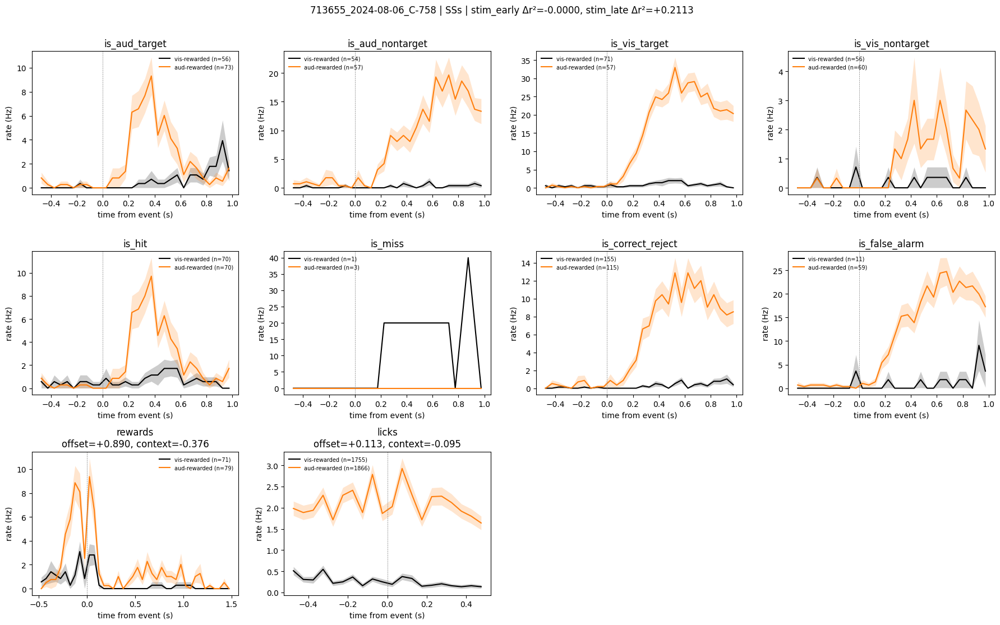

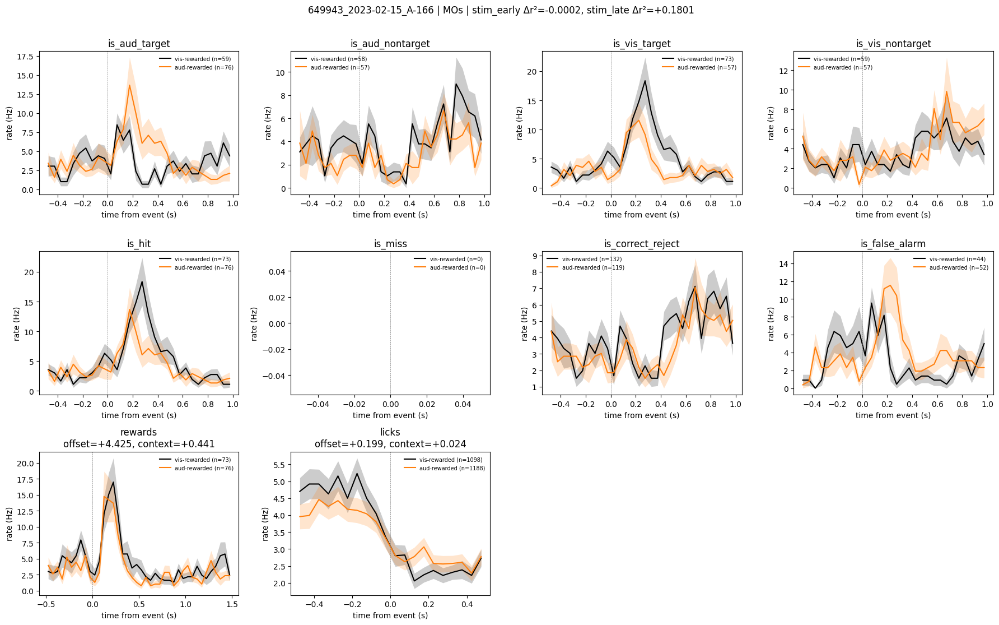

In [71]:
# Units with high delta_r2_stim_late but low delta_r2_stim_early:
# context modulates the *late* part of the stimulus response but not the early part.
N_UNITS = 4

candidates = (
    merged_df
    .filter(pl.col("converged"))
    .filter(pl.col("cv_r2") > CV2_THRESH)
    .drop_nulls(["delta_r2_stim_late", "delta_r2_stim_early"])
    # low early: early Δr² near zero (small magnitude -> early response barely
    # context-modulated), below the median |early| across qualifying units
    .filter(pl.col("delta_r2_stim_early").abs() < pl.col("delta_r2_stim_early").abs().median())
    # of those, take the ones with the strongest late context modulation
    .with_columns((pl.col("delta_r2_stim_late") - pl.col("delta_r2_stim_early")).alias("late_minus_early"))
    .sort("delta_r2_stim_late", descending=True)
    .head(N_UNITS)
    .select("unit_id", "structure", "cv_r2",
            "delta_r2_stim_early", "delta_r2_stim_late", "late_minus_early")
)
display(candidates)

for uid in candidates["unit_id"]:
    row = candidates.filter(pl.col("unit_id") == uid)
    fig = plot_unit_response(uid)
    fig.suptitle(
        f"{uid} | {row['structure'][0]} | "
        f"stim_early Δr²={row['delta_r2_stim_early'][0]:+.4f}, "
        f"stim_late Δr²={row['delta_r2_stim_late'][0]:+.4f}",
        y=1.01,
    )
    plt.show()

In [80]:
merged_df.filter(pl.col('unit_id') == '649943_2023-02-15_A-166')['delta_r2_stim_late_per_fold'].to_numpy()

array([array([0.10089199, 0.17479092, 0.20946093, 0.12010673, 0.295482  ])],
      dtype=object)

unit_id,structure,cv_r2,delta_r2_stim_early,delta_r2_stim_late,early_minus_late
str,str,f64,f64,f64,f64
"""713655_2024-08-08_A-65""","""VM""",0.061692,0.003527,-0.000517,0.004044
"""741148_2024-10-17_A-17""","""VM""",0.106009,0.000906,0.000188,0.000718
"""713655_2024-08-08_A-53""","""VM""",0.058561,0.000868,0.001252,-0.000384
"""713655_2024-08-08_A-50""","""VM""",0.05316,0.000635,0.000777,-0.000142
"""712815_2024-05-21_B-17""","""VM""",0.249499,0.000304,-0.00076,0.001064
"""713655_2024-08-08_A-545""","""VM""",0.061477,0.000067,-0.000133,0.0002
"""741148_2024-10-17_A-21""","""VM""",0.089448,-0.001796,0.000998,-0.002794


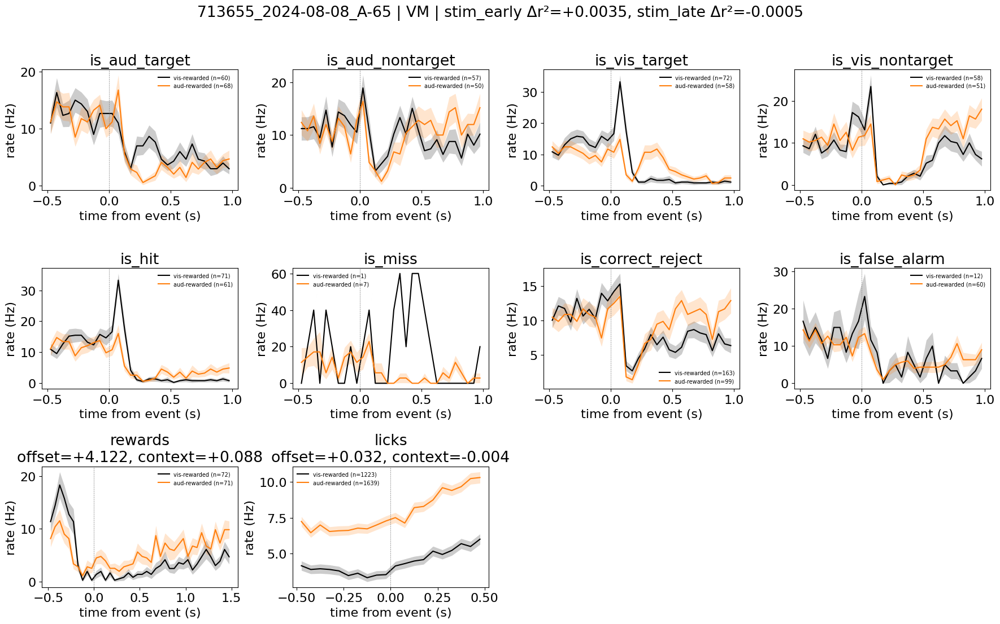

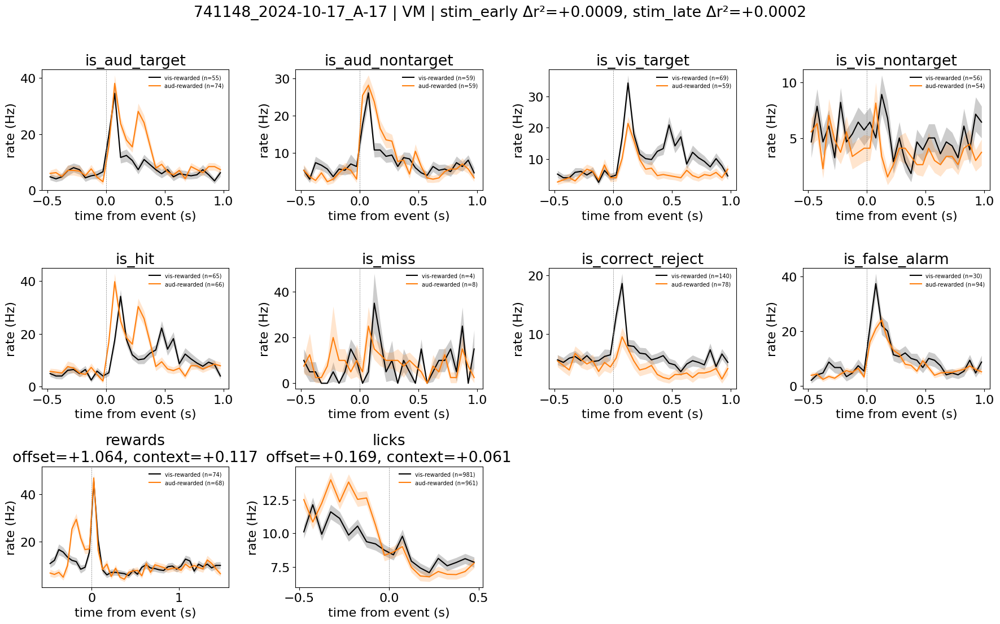

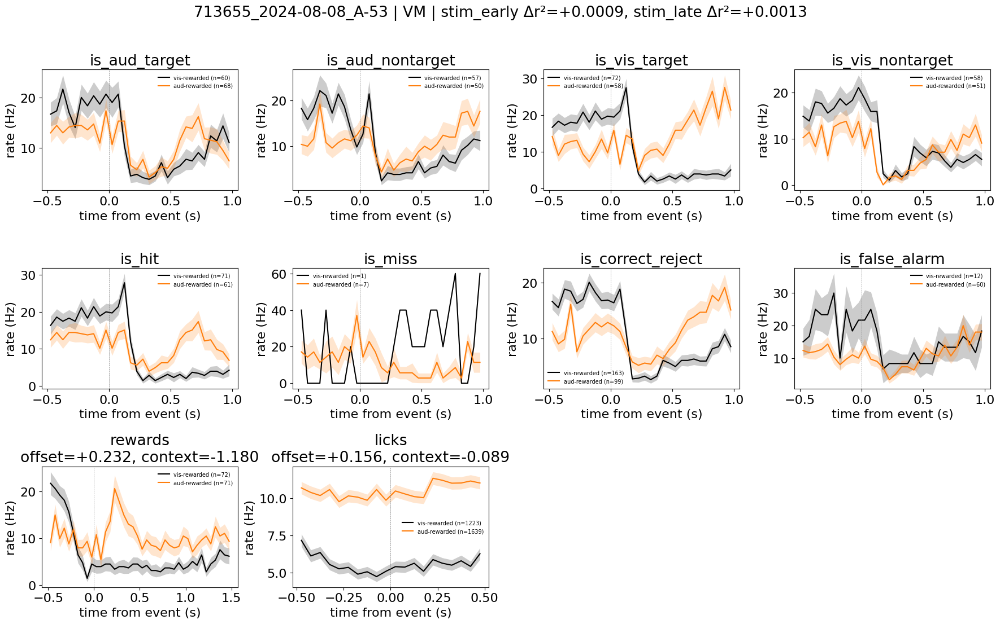

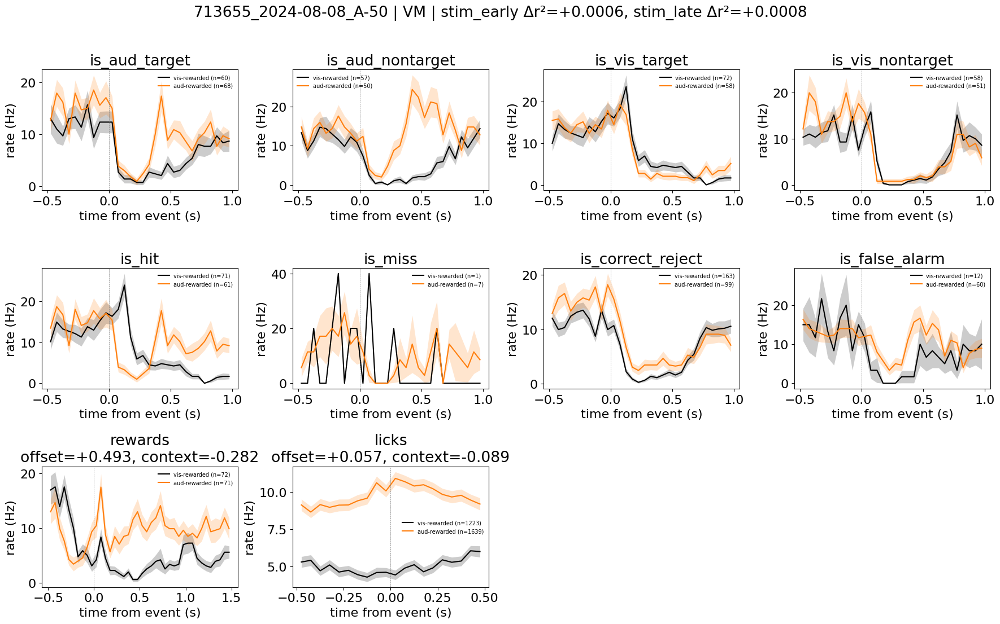

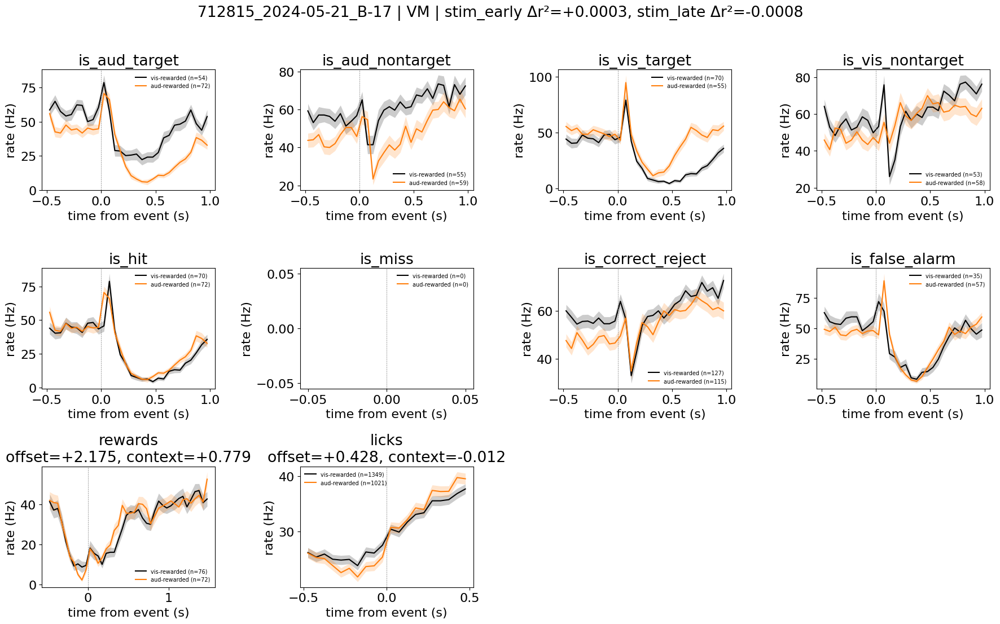

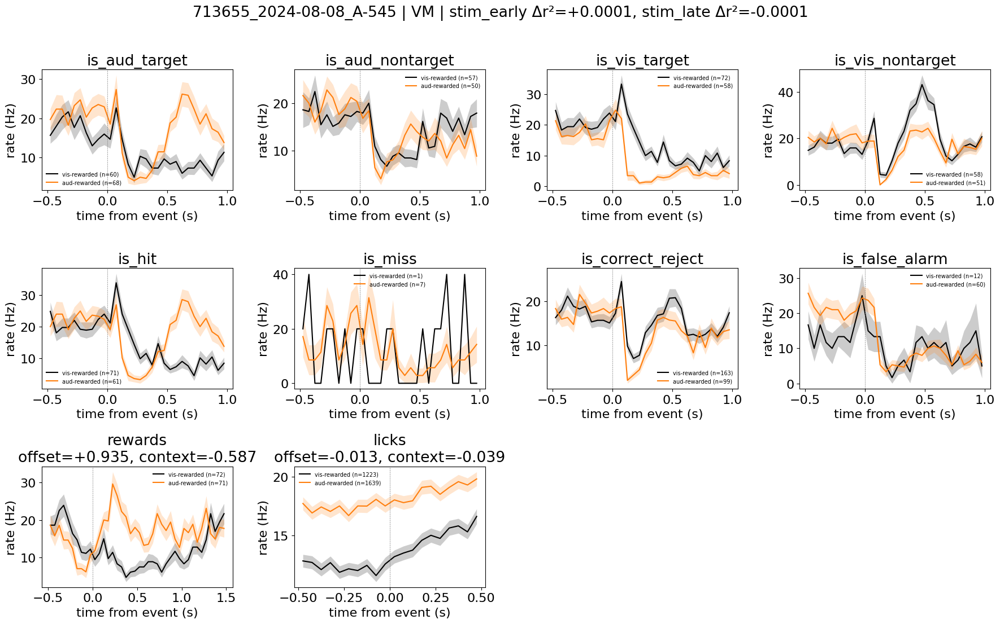

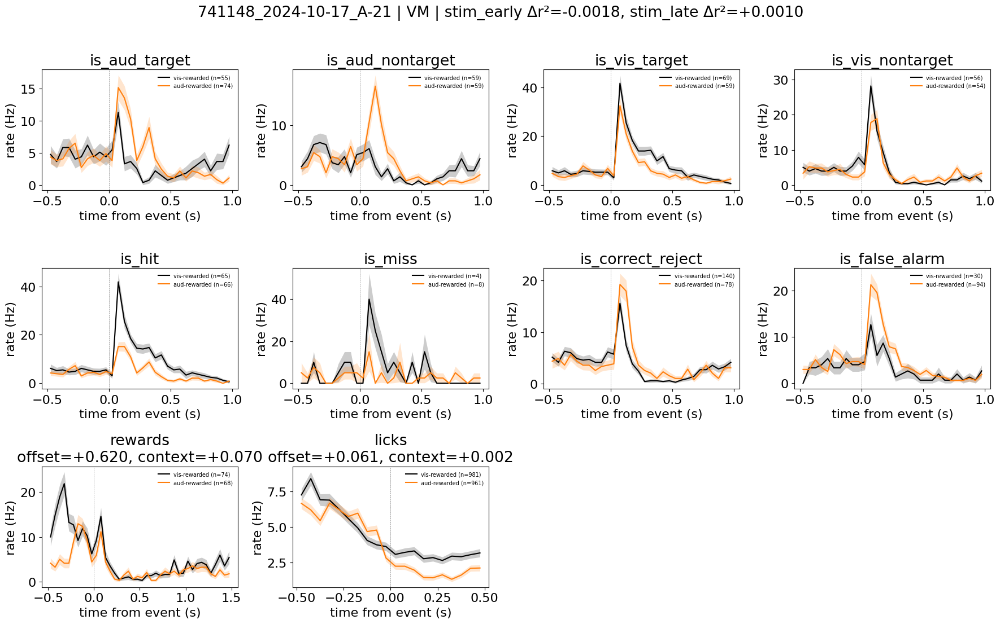

In [22]:
# Inverse: high delta_r2_stim_early but low delta_r2_stim_late.
# Context modulates the *early* part of the stimulus response but not the late part.
N_UNITS = 10

candidates = (
    merged_df
    .filter(pl.col("converged"))
    .filter(pl.col("cv_r2") > CV2_THRESH)
    .drop_nulls(["delta_r2_stim_late", "delta_r2_stim_early"])
    # low late: late Δr² near zero (small magnitude -> late response barely
    # context-modulated), below the median |late| across qualifying units
    .filter(pl.col("delta_r2_stim_late").abs() < pl.col("delta_r2_stim_late").abs().median())
    .filter(pl.col('structure').is_in(['VM']))
    # of those, take the ones with the strongest early context modulation
    .with_columns((pl.col("delta_r2_stim_early") - pl.col("delta_r2_stim_late")).alias("early_minus_late"))
    .sort("delta_r2_stim_early", descending=True)
    .head(N_UNITS)
    .select("unit_id", "structure", "cv_r2",
            "delta_r2_stim_early", "delta_r2_stim_late", "early_minus_late")
)
display(candidates)

for uid in candidates["unit_id"]:
    row = candidates.filter(pl.col("unit_id") == uid)
    fig = plot_unit_response(uid)
    fig.suptitle(
        f"{uid} | {row['structure'][0]} | "
        f"stim_early Δr²={row['delta_r2_stim_early'][0]:+.4f}, "
        f"stim_late Δr²={row['delta_r2_stim_late'][0]:+.4f}",
        y=1.01,
    )
    plt.show()

unit_id,structure,cv_r2,delta_r2_stim_early,delta_r2_stim_late,early_minus_late
str,str,f64,f64,f64,f64
"""668755_2023-08-31_A-684""","""CP""",0.320533,0.12345,0.012754,0.110696
"""674562_2023-10-03_D-14""","""CP""",0.331035,0.070963,0.059315,0.011648
"""713655_2024-08-06_F-334""","""CP""",0.294704,0.05076,0.06963,-0.01887
"""713655_2024-08-06_F-160""","""CP""",0.317821,0.047985,0.03466,0.013326
"""667252_2023-09-26_F-138""","""CP""",0.160905,0.047731,0.028645,0.019086
"""674562_2023-10-02_D-344""","""CP""",0.096519,0.045388,0.001696,0.043691
"""674562_2023-10-03_D-497""","""CP""",0.356619,0.043237,0.046035,-0.002797
"""714748_2024-06-26_F-17""","""CP""",0.291152,0.04042,0.026175,0.014244
"""686176_2023-12-07_A-3""","""CP""",0.260156,0.036772,0.005645,0.031127


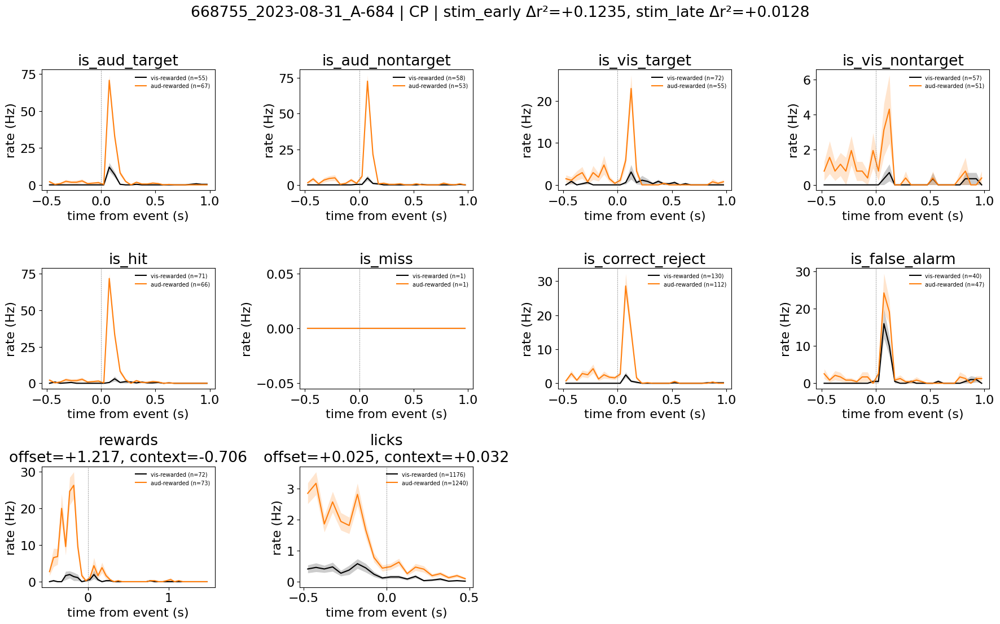

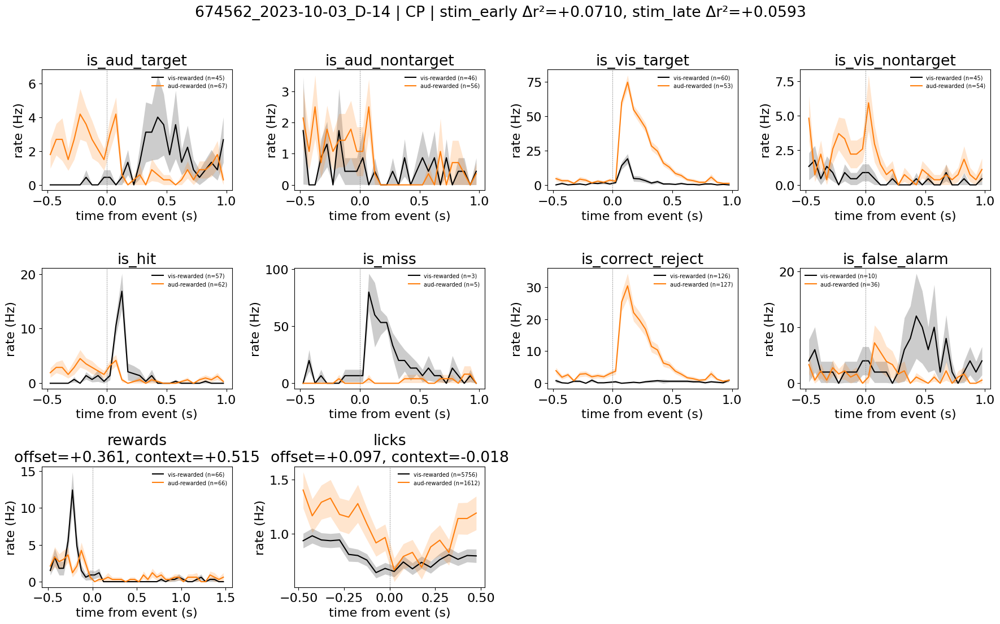

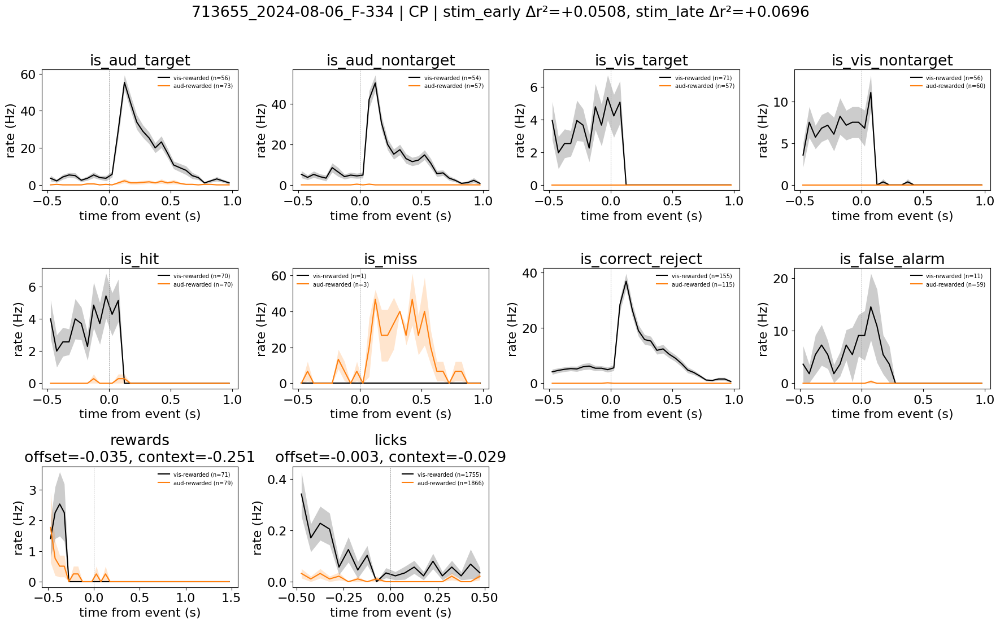

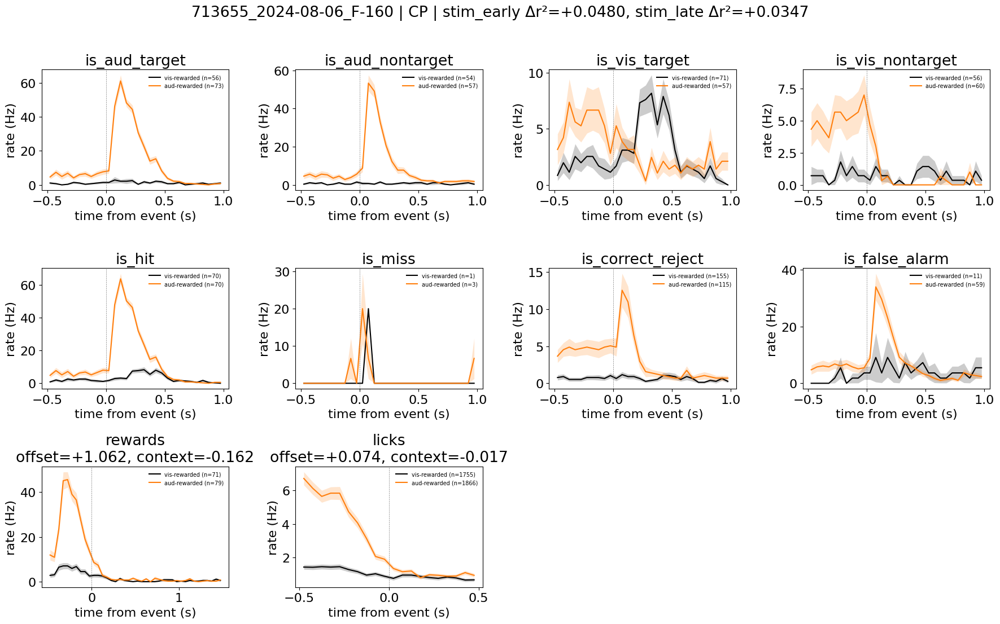

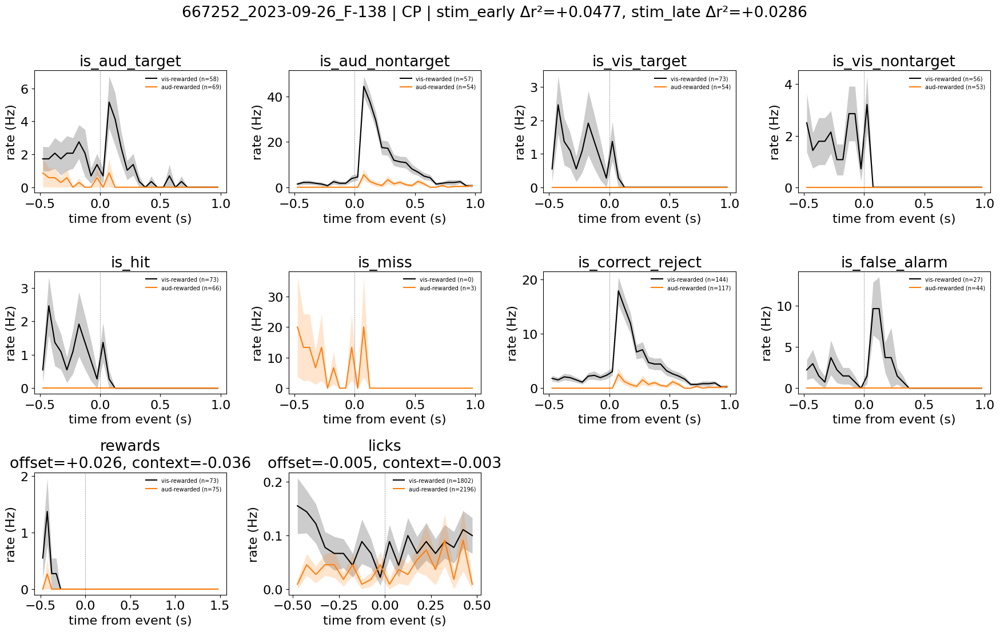

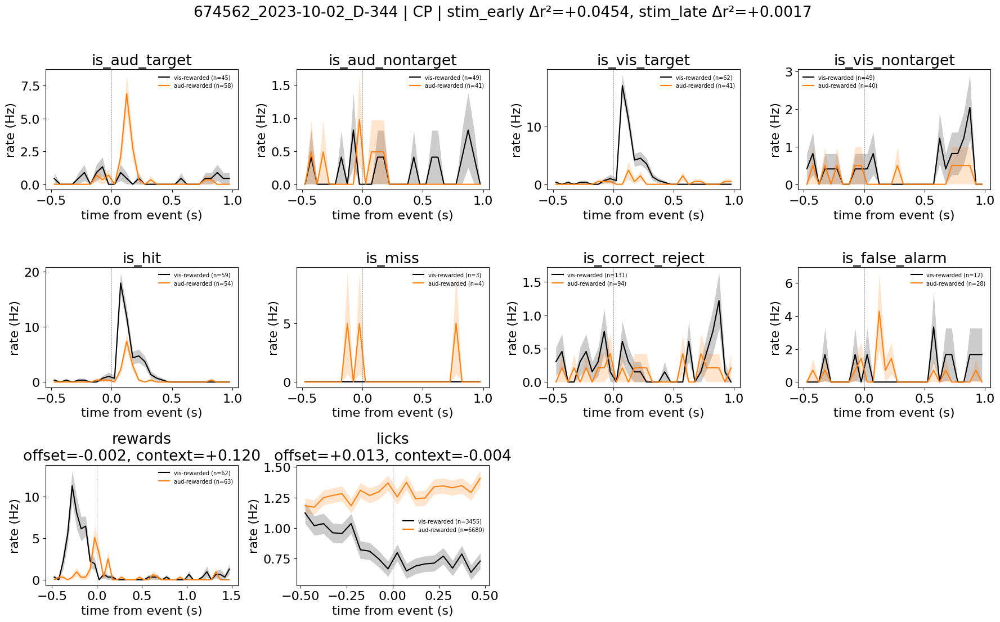

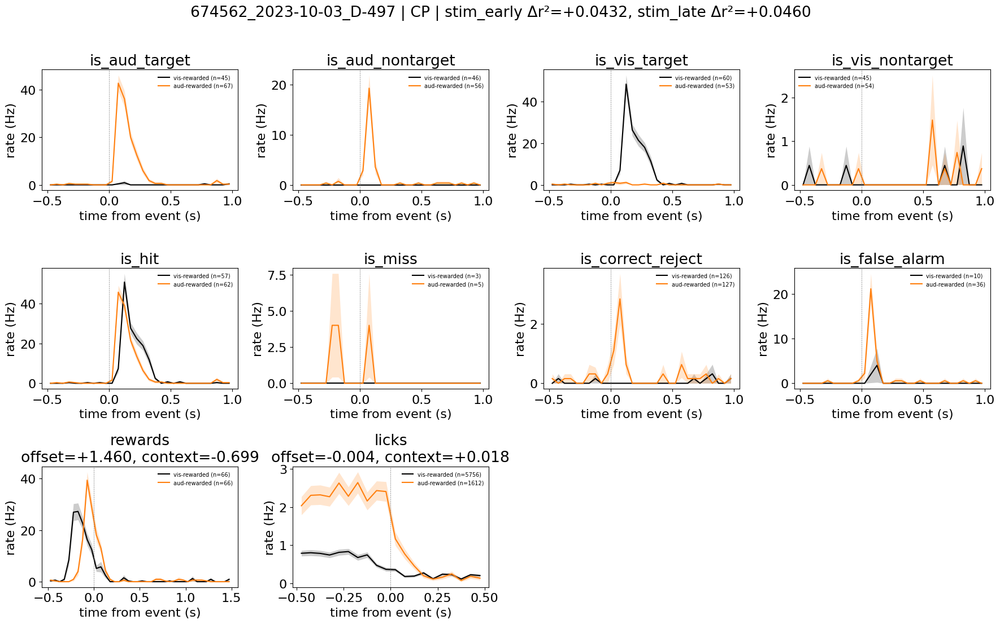

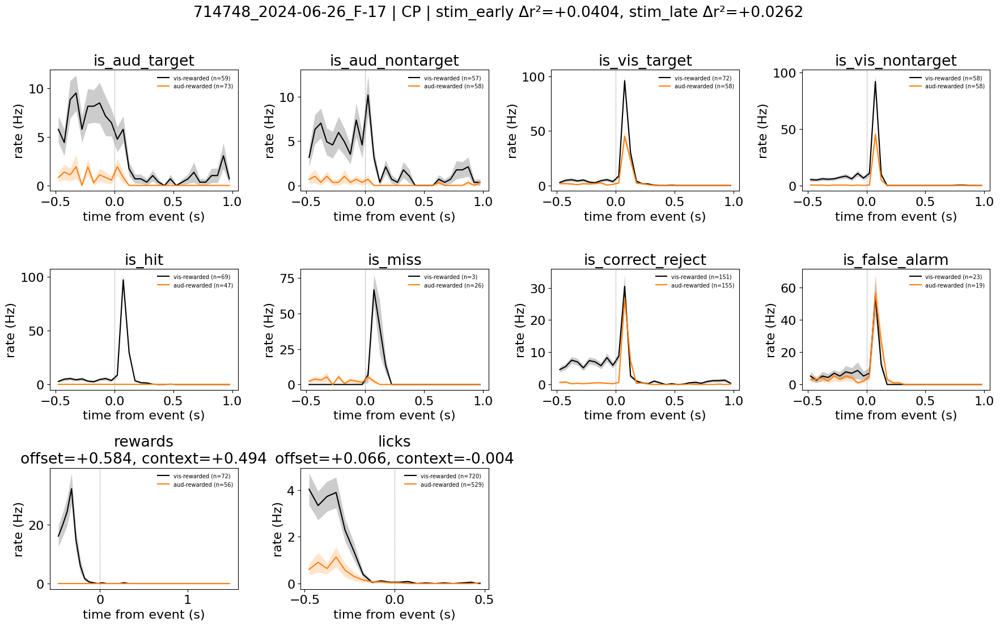

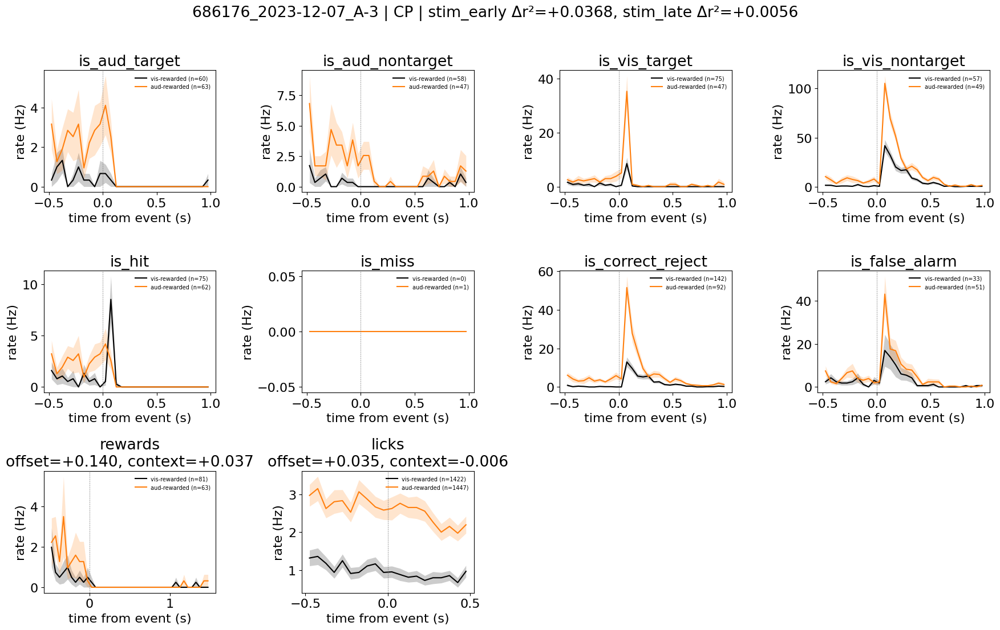

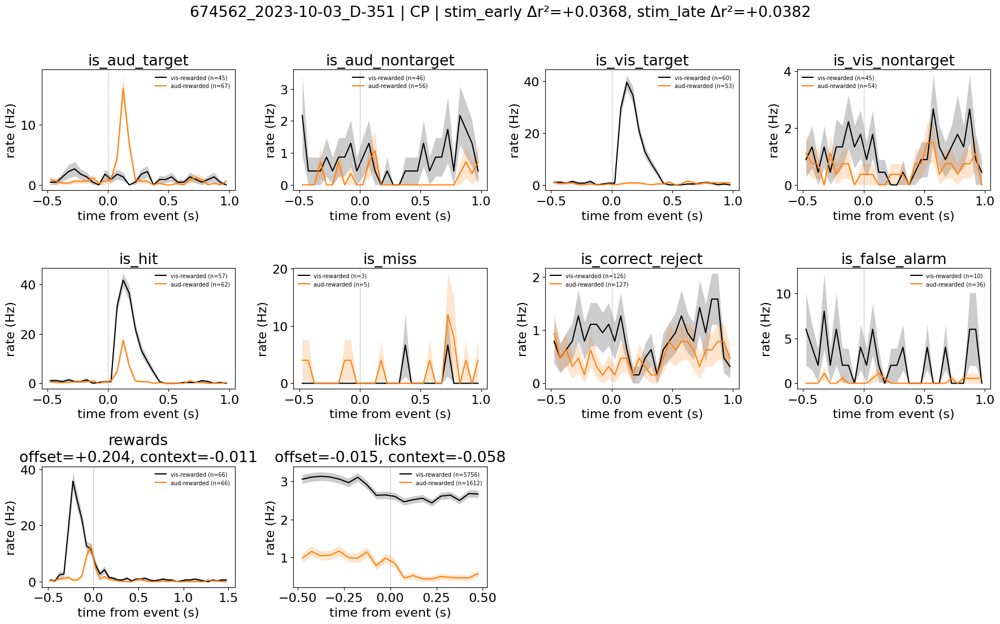

In [32]:
# Context modulates the early part; agnostic to late modulation
N_UNITS = 10

candidates = (
    merged_df
    .filter(pl.col("converged"))
    .filter(pl.col("cv_r2") > CV2_THRESH)
    .drop_nulls(["delta_r2_stim_late", "delta_r2_stim_early"])
    # low late: late Δr² near zero (small magnitude -> late response barely
    .filter(pl.col('structure').is_in(['CP']))
    # of those, take the ones with the strongest early context modulation
    .with_columns((pl.col("delta_r2_stim_early") - pl.col("delta_r2_stim_late")).alias("early_minus_late"))
    .sort("delta_r2_stim_early", descending=True)
    .head(N_UNITS)
    .select("unit_id", "structure", "cv_r2",
            "delta_r2_stim_early", "delta_r2_stim_late", "early_minus_late")
)
display(candidates)

for uid in candidates["unit_id"]:
    row = candidates.filter(pl.col("unit_id") == uid)
    fig = plot_unit_response(uid)
    fig.suptitle(
        f"{uid} | {row['structure'][0]} | "
        f"stim_early Δr²={row['delta_r2_stim_early'][0]:+.4f}, "
        f"stim_late Δr²={row['delta_r2_stim_late'][0]:+.4f}",
        y=1.01,
    )
    plt.show()

unit_id,structure,cv_r2,delta_r2,delta_r2_stim_early,delta_r2_stim_late,max_abs_delta
str,str,f64,f64,f64,f64,f64
"""644864_2023-01-30_A-275""","""APN""",0.761706,0.000744,-0.000194,0.000842,0.000842
"""741137_2024-10-10_B-31""","""SCiw""",0.61813,0.000919,-0.000088,0.000373,0.000919
"""644867_2023-02-23_C-213""","""VISp""",0.606876,-0.000595,-0.000193,-0.000337,0.000595
"""706401_2024-04-24_C-251""","""VISp""",0.606849,-0.00012,0.000111,-0.000255,0.000255


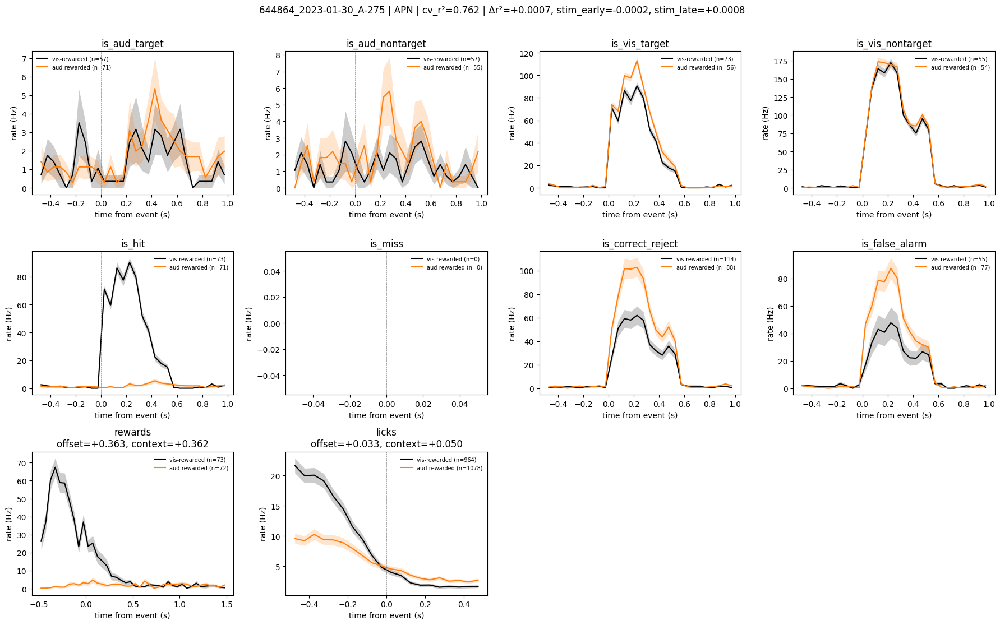

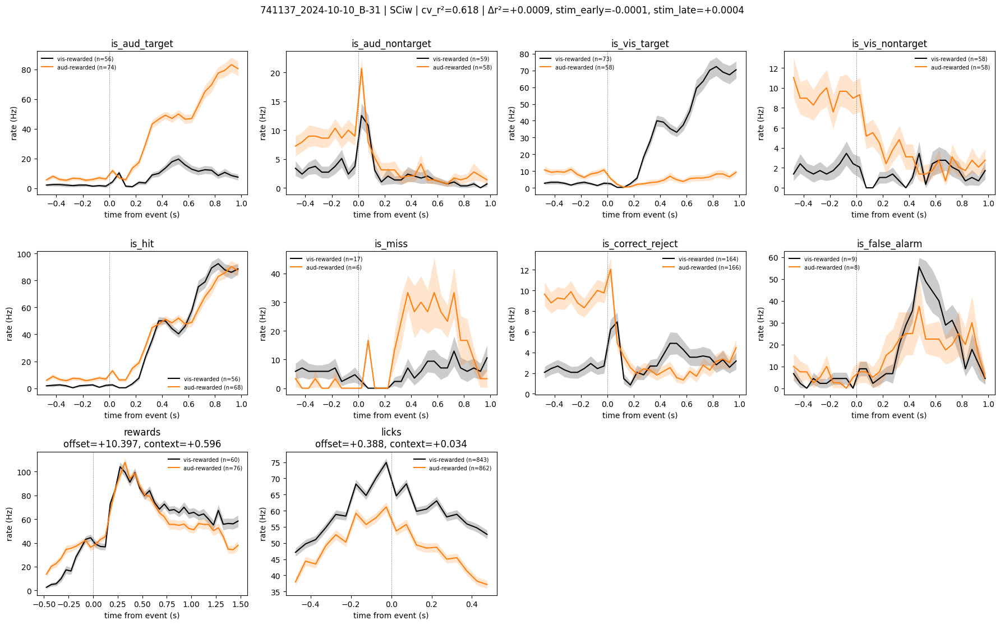

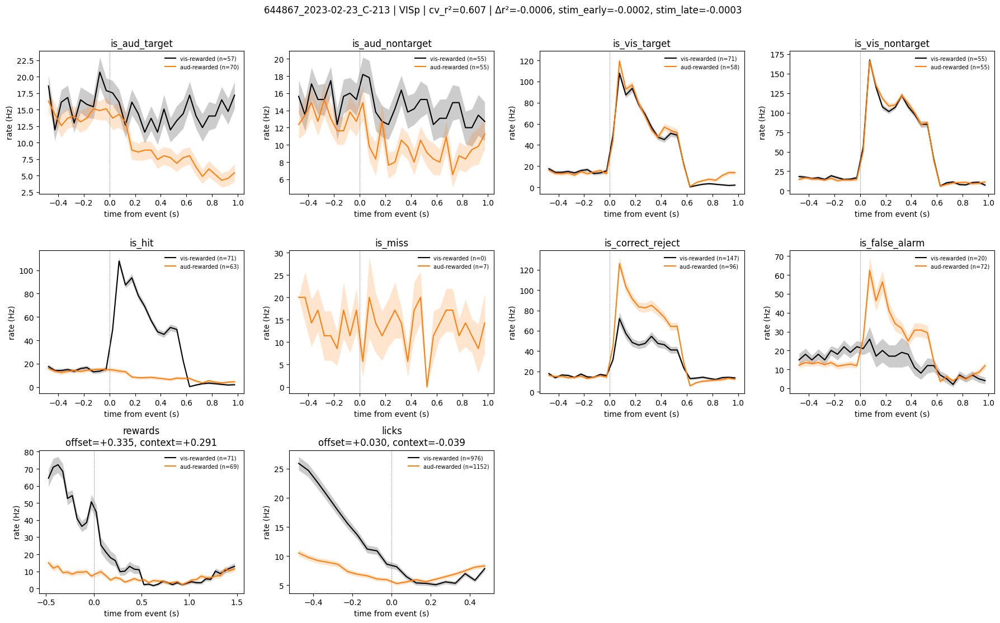

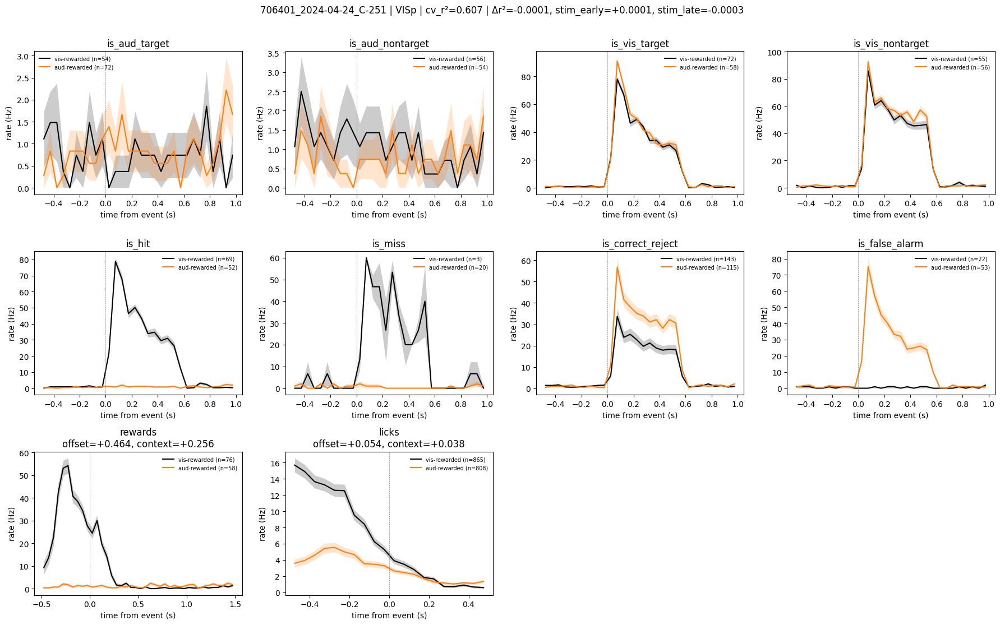

In [73]:
# Well-fit but context-invariant units: high cv_r2 with near-zero context Δr².
# The model captures these units well, but context adds essentially nothing ->
# stimulus/behavior driven but context-independent.
N_UNITS = 4
DELTA_COLS = ["delta_r2", "delta_r2_stim_early", "delta_r2_stim_late"]

qc = (
    merged_df
    .filter(pl.col("converged"))
    .filter(pl.col("cv_r2") > CV2_THRESH)
    .drop_nulls(DELTA_COLS)
)
# "near zero": every context Δr² has small magnitude, below the per-metric
# median |Δr²| across qualifying units
candidates = (
    qc
    .filter(
        pl.all_horizontal([
            pl.col(c).abs() < qc[c].abs().median() for c in DELTA_COLS
        ])
    )
    .with_columns(
        pl.max_horizontal([pl.col(c).abs() for c in DELTA_COLS]).alias("max_abs_delta")
    )
    # of those, take the best-fit units
    .sort("cv_r2", descending=True)
    .head(N_UNITS)
    .select("unit_id", "structure", "cv_r2", *DELTA_COLS, "max_abs_delta")
)
display(candidates)

for uid in candidates["unit_id"]:
    row = candidates.filter(pl.col("unit_id") == uid)
    fig = plot_unit_response(uid)
    fig.suptitle(
        f"{uid} | {row['structure'][0]} | cv_r²={row['cv_r2'][0]:.3f} | "
        f"Δr²={row['delta_r2'][0]:+.4f}, "
        f"stim_early={row['delta_r2_stim_early'][0]:+.4f}, "
        f"stim_late={row['delta_r2_stim_late'][0]:+.4f}",
        y=1.01,
    )
    plt.show()

In [88]:
adf.columns

['session_id',
 'unit_id',
 'train_r2',
 'cv_r2',
 'delta_r2',
 'intercept',
 'n_iter',
 'converged',
 'cv_r2_per_fold',
 'delta_r2_per_fold',
 'n_iter_per_fold',
 'delta_r2_stim_early',
 'delta_r2_stim_late',
 'delta_r2_stim_early_per_fold',
 'delta_r2_stim_late_per_fold',
 'kernel_is_aud_target_early',
 'kernel_is_aud_target_late',
 'kernel_is_aud_nontarget_early',
 'kernel_is_aud_nontarget_late',
 'kernel_is_vis_target_early',
 'kernel_is_vis_target_late',
 'kernel_is_vis_nontarget_early',
 'kernel_is_vis_nontarget_late',
 'kernel_licks',
 'kernel_rewards',
 'kernel_running_speed',
 'kernel_pupil_area',
 'kernel_ear',
 'kernel_jaw',
 'kernel_nose',
 'kernel_whisker_pad',
 'kernel_context_baseline',
 'kernel_time',
 'gain_is_aud_target_early_offset',
 'gain_is_aud_target_early_context',
 'gain_is_aud_target_late_offset',
 'gain_is_aud_target_late_context',
 'gain_is_aud_nontarget_early_offset',
 'gain_is_aud_nontarget_early_context',
 'gain_is_aud_nontarget_late_offset',
 'gain_is_au

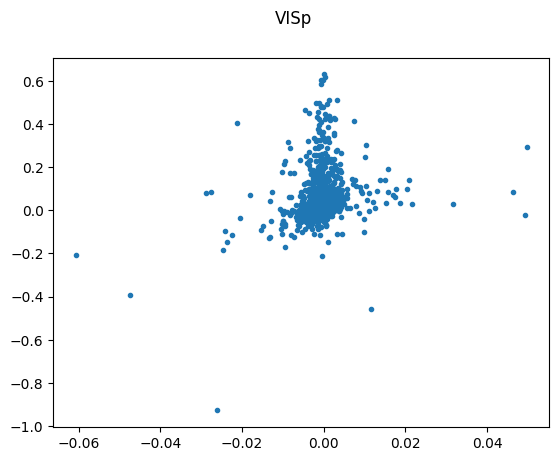

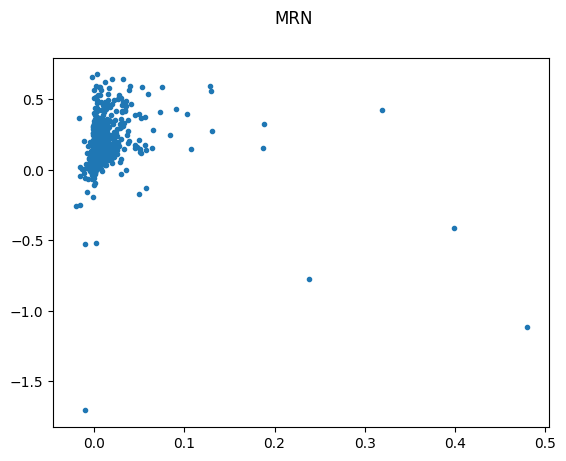

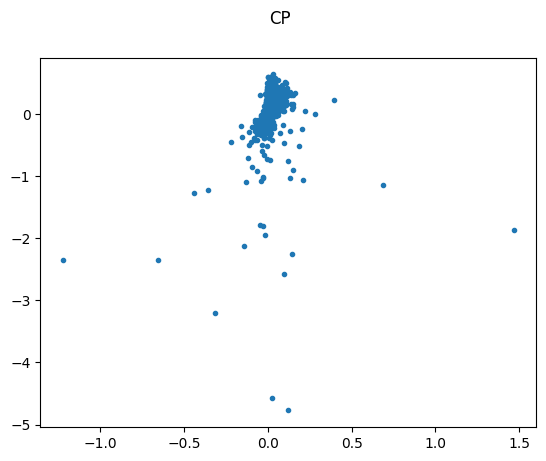

In [92]:
areas_to_plot = ['VISp', 'MRN', 'CP']

for area in areas_to_plot:
    fig, ax = plt.subplots()
    fig.suptitle(area)

    adf = (
            merged_df
            .filter(pl.col('structure')==area)
            .filter(pl.col('converged'))
    )

    ax.plot(adf['delta_r2'], adf['cv_r2'], '.')
    #ax.plot([0, 0.5], [0, 0.5], 'k--')
    #ax.set_xlim(0, 0.5)
    #ax.set_ylim(0, 0.5)

In [ ]:
# How many units have delta_r2 > cv_r2 ? This is exactly the condition that the
# REDUCED model's held-out R² (= cv_r2 - delta) goes negative -> removing that
# gain makes the prediction worse than the mean. Tallied per delta metric.
DELTA_COLS = ["delta_r2", "delta_r2_stim_early", "delta_r2_stim_late"]

conv = merged_df.filter(pl.col("converged"))
n_conv = conv.height
print(f"converged units: {n_conv:,}\n")

print(f"{'metric':<22}{'delta>cv_r2':>14}{'(% conv)':>11}"
      f"{'+ cv_r2>0.01':>15}{'(% of those)':>15}")
for col in DELTA_COLS:
    d = conv.drop_nulls(col)
    gt = d.filter(pl.col(col) > pl.col("cv_r2"))
    n_gt = gt.height
    # subset where the full model was actually well-fit (cv_r2 > threshold):
    # there the negative reduced-R² is most striking
    n_gt_wellfit = gt.filter(pl.col("cv_r2") > CV2_THRESH).height
    print(f"{col:<22}{n_gt:>14,}{100*n_gt/d.height:>10.1f}%"
          f"{n_gt_wellfit:>15,}{(100*n_gt_wellfit/n_gt if n_gt else 0):>14.1f}%")

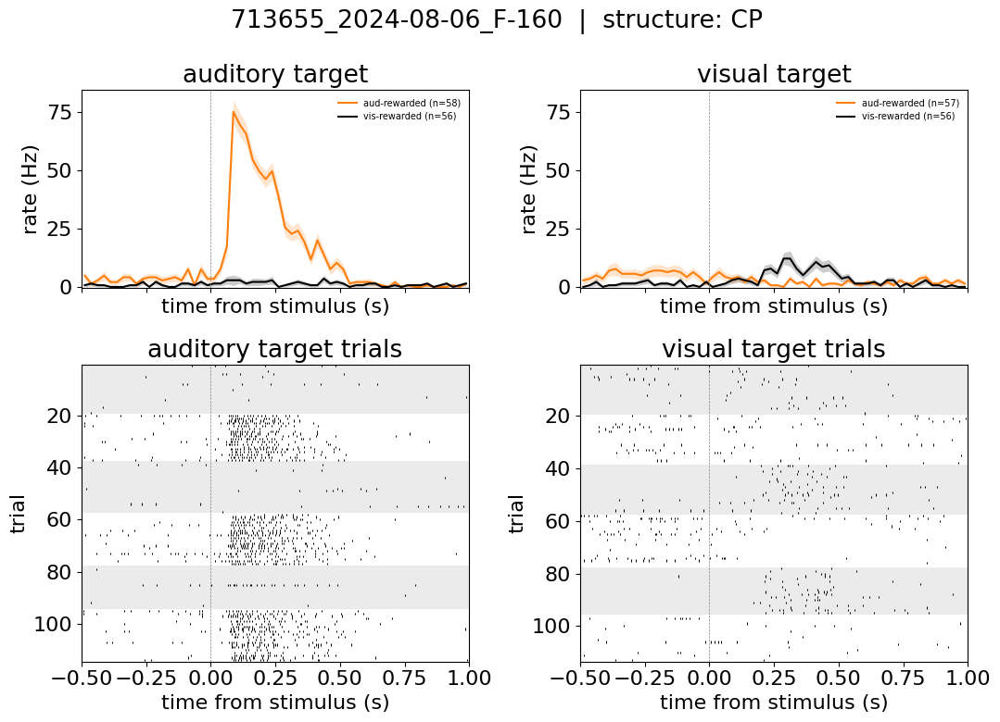

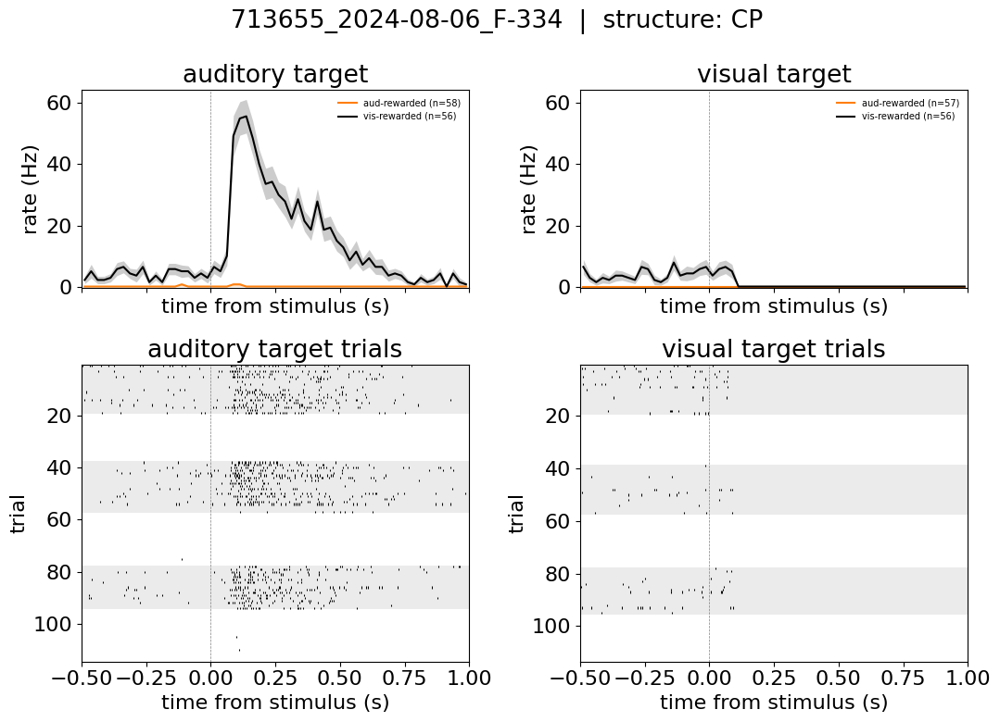

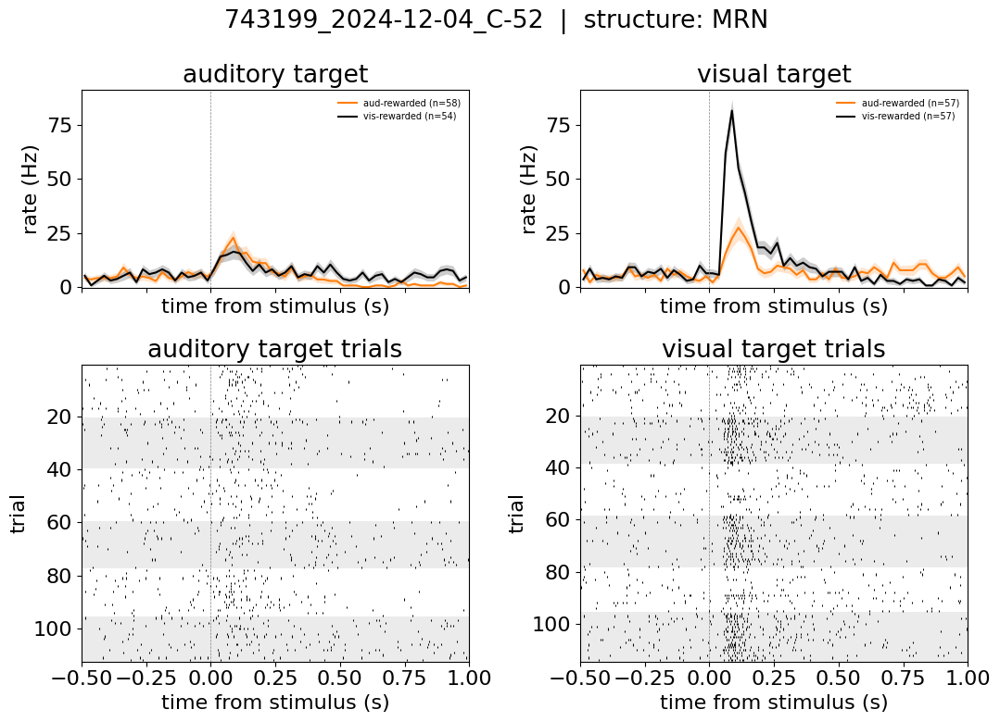

In [54]:
f1 = plot_target_responses_and_rasters('713655_2024-08-06_F-160', bin_size = 0.025)
f2 = plot_target_responses_and_rasters('713655_2024-08-06_F-334', bin_size = 0.025)
f3 = plot_target_responses_and_rasters('743199_2024-12-04_C-52', bin_size = 0.025)

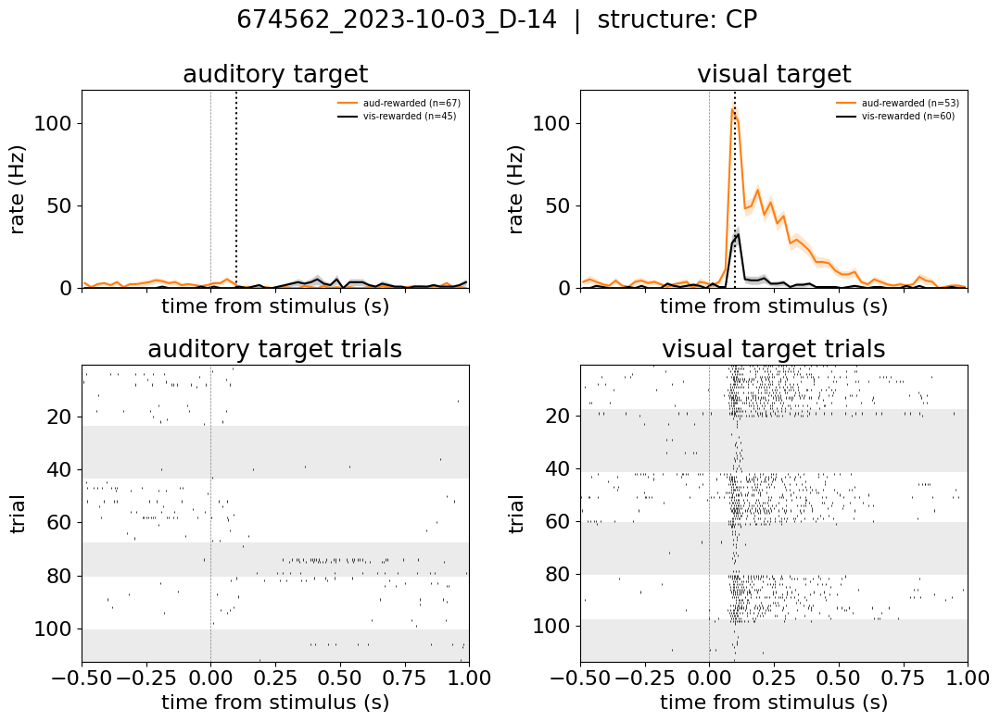

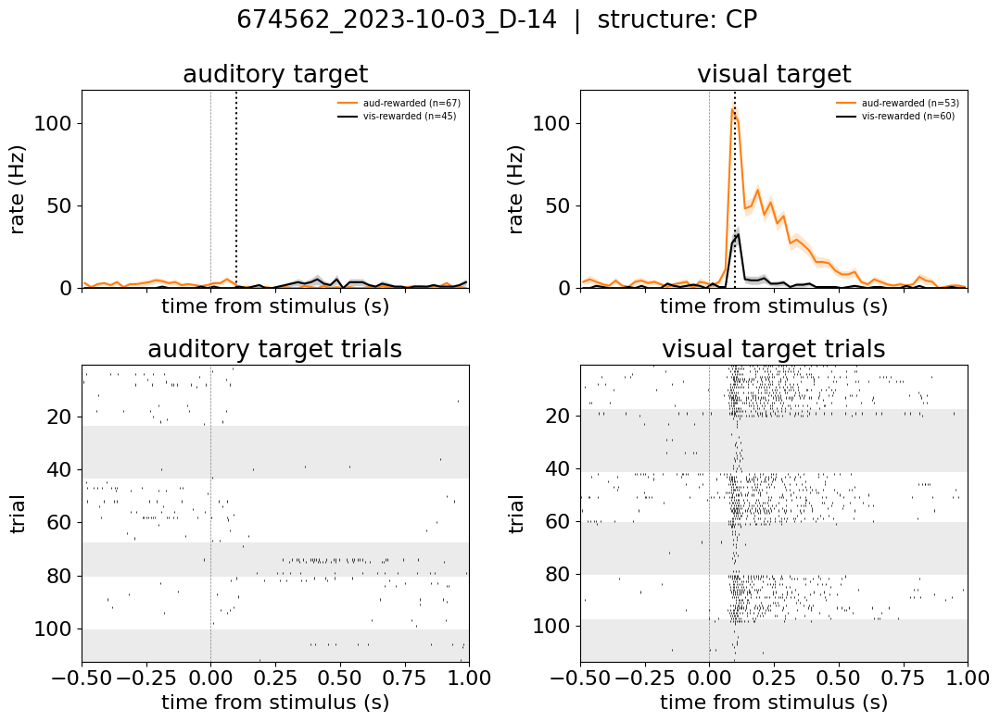

In [37]:
plot_target_responses_and_rasters('674562_2023-10-03_D-14', bin_size = 0.025)